<h2 align="center">Trabajo de Fin de Máster:</h2>

<h1 align="center">Análisis Avanzado de Datos para la Predicción de Movimientos en el Mercado de Valores y la Identificación de Factores Influyentes en Empresas del Sector Eléctrico del IBEX 35</h1>


<h2 align="center">Autor: Eduardo Mora González</h2>


### LIBRERÍAS

In [65]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mplfinance as mpf
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from hyperopt.pyll.stochastic import sample
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import TimeSeriesSplit
import random
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials
from hyperopt import fmin, tpe, STATUS_OK, Trials
from datetime import timedelta
from plotly.subplots import make_subplots
import plotly.graph_objects as go

np.random.seed(42)
random.seed(42)

# OBTENCIÓN DE LOS DATOS


## Obtenemos el histórico de cotizaciones y de dividendos para generar un fichero y guardarlo en la carpeta ./data/

In [2]:
# Fecha de inicio y fin para obtener el histórico de cotizaciones y dividendos
start = "2001-01-02"
end = "2023-06-02"

### Acciones de Endesa

In [3]:
cotizacion_Endesa = yf.download('ELE.MC', start=start, end=end)
cotizacion_Endesa.to_csv('./data/cotizacion_Endesa.csv')
print("COTIZACIÓN ENDESA")
cotizacion_Endesa.head()

[*********************100%%**********************]  1 of 1 completed
COTIZACIÓN ENDESA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2001-01-02,18.150000,18.770000,17.700001,18.68,2.334867,3900039
2001-01-03,18.379999,20.070000,18.379999,19.90,2.487358,10223480
2001-01-04,20.000000,20.100000,18.900000,19.00,2.374865,7637974
2001-01-05,19.180000,19.180000,18.330000,18.68,2.334867,6998680
2001-01-08,18.719999,19.049999,18.500000,18.82,2.352366,4031715


In [4]:
dividendos_Endesa = yf.Ticker('ELE.MC').dividends.loc[start:end]
dividendos_Endesa.to_csv('./data/dividendos_Endesa.csv')
print("DIVIDENDOS ENDESA")
dividendos_Endesa.head()

DIVIDENDOS ENDESA


Date
2001-01-02 00:00:00+01:00    0.2400
2001-07-02 00:00:00+02:00    0.4100
2002-01-02 00:00:00+01:00    0.2640
2002-07-01 00:00:00+02:00    0.4185
2003-01-02 00:00:00+01:00    0.2640
Name: Dividends, dtype: float64

### Acciones de Iberdrola

In [102]:
cotizacion_Iberdrola = yf.download('IBE.MC', start=start, end=end)
cotizacion_Iberdrola.to_csv('./data/cotizacion_Iberdrola.csv')
print("COTIZACIÓN IBERDROLA")
cotizacion_Iberdrola.head()

[*********************100%%**********************]  1 of 1 completed
COTIZACIÓN IBERDROLA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2001-01-02,3.3375,3.4700,3.2525,3.3975,1.214773,9392264
2001-01-03,3.3525,3.7000,3.3525,3.7000,1.322931,26070124
2001-01-04,3.6875,3.6875,3.4875,3.4875,1.246952,20124272
2001-01-05,3.5600,3.5600,3.4025,3.5575,1.271981,16939544
2001-01-08,3.5575,3.5875,3.4775,3.5625,1.273768,13723568


In [109]:
dividendos_Iberdrola = yf.Ticker('IBE.MC').dividends.loc[start:end]
dividendos_Iberdrola.to_csv('./data/dividendos_Iberdrola.csv')
print("DIVIDENDOS IBERDROLA")
dividendos_Iberdrola.head()

DIVIDENDOS IBERDROLA


Date
2001-01-02 00:00:00+01:00    0.057500
2001-07-02 00:00:00+02:00    0.078872
2002-01-02 00:00:00+01:00    0.061525
2002-07-01 00:00:00+02:00    0.084712
2003-01-02 00:00:00+01:00    0.065000
Name: Dividends, dtype: float64

### Acciones de Acciona Energías

In [108]:
cotizacion_Acciona_Energias = yf.download('ANE.MC', start=start, end=end)
cotizacion_Acciona_Energias.to_csv('./data/cotizacion_Acciona_Energias.csv')
print("COTIZACIÓN ACCIONA ENERGÍAS")
cotizacion_Acciona_Energias.head()

[*********************100%%**********************]  1 of 1 completed
COTIZACIÓN ACCIONA ENERGÍAS


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-07-02,29.000000,29.299999,27.990000,29.299999,28.436935,1048322
2021-07-05,29.500000,29.500000,28.549999,29.000000,28.145775,721560
2021-07-06,29.100000,29.100000,28.500000,28.790001,27.941961,339807
2021-07-07,28.790001,29.500000,28.520000,29.500000,28.631046,396667
2021-07-08,29.480000,29.900000,29.059999,29.900000,29.019264,279224


In [110]:
dividendos_Acciona_Energias = yf.Ticker('ANE.MC').dividends.loc[start:end]
dividendos_Acciona_Energias.to_csv('./data/dividendos_Acciona_Energias.csv')
print("DIVIDENDOS ACCIONA ENERGÍAS")
dividendos_Acciona_Energias.head()

DIVIDENDOS ACCIONA ENERGÍAS


Date
2022-04-19 00:00:00+02:00    0.280111
Name: Dividends, dtype: float64

### Acciones de Solaria

In [111]:
cotizacion_Solaria = yf.download('SLR.MC', start=start, end=end)
cotizacion_Solaria.to_csv('./data/cotizacion_Solaria.csv')
print("COTIZACIÓN SOLARIA")
cotizacion_Solaria.head()

[*********************100%%**********************]  1 of 1 completed
COTIZACIÓN SOLARIA


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2007-06-19,12.50,12.99,10.82,11.90,11.528428,18065380
2007-06-20,11.90,13.40,11.80,12.95,12.545643,8887020
2007-06-21,12.95,13.33,12.51,12.57,12.177507,3080259
2007-06-22,12.75,12.80,11.90,12.37,11.983753,1822089
2007-06-25,12.37,12.80,12.00,12.77,12.371264,4761130


In [112]:
dividendos_Solaria = yf.Ticker('SLR.MC').dividends.loc[start:end]
dividendos_Solaria.to_csv('./data/dividendos_Solaria.csv')
print("DIVIDENDOS SOLARIA")
dividendos_Solaria.head()

DIVIDENDOS SOLARIA


Date
2010-09-15 00:00:00+02:00    0.020
2011-05-25 00:00:00+02:00    0.015
2011-10-03 00:00:00+02:00    0.020
Name: Dividends, dtype: float64

### Acciones de Naturgy


In [113]:
cotizacion_Naturgy = yf.download('NTGY.MC', start=start, end=end)
cotizacion_Naturgy.to_csv('./data/cotizacion_Naturgy.csv')
print("COTIZACIÓN NATURGY")
cotizacion_Naturgy.head()

[*********************100%%**********************]  1 of 1 completed
COTIZACIÓN NATURGY


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2001-01-02,16.563990,17.245285,16.291471,16.606569,5.298070,1120990
2001-01-03,16.393665,17.330446,16.265923,17.279348,5.512709,1511823
2001-01-04,17.458189,17.458189,16.879087,17.321930,5.526295,1717835
2001-01-05,17.321930,17.458189,16.572506,16.598055,5.295355,1347595
2001-01-08,16.793926,16.930185,16.640635,16.776894,5.352409,733408


In [114]:
dividendos_Naturgy = yf.Ticker('NTGY.MC').dividends.loc[start:end]
dividendos_Naturgy.to_csv('./data/dividendos_Naturgy.csv')
print("DIVIDENDOS NATURGY")
dividendos_Naturgy.head()

DIVIDENDOS NATURGY


Date
2001-01-11 00:00:00+01:00    0.102194
2001-07-02 00:00:00+02:00    0.136259
2002-01-10 00:00:00+01:00    0.119227
2002-07-01 00:00:00+02:00    0.161808
2003-01-10 00:00:00+01:00    0.144775
Name: Dividends, dtype: float64

Observamos que la API presenta una limitación al proporcionar únicamente el historial de cotizaciones para Endesa, Naturgy e Iberdrola desde el año 2001, el de Solaria desde el año 2007 y el de Acciona Energías desde el año 2021. Esta restricción surge de la disponibilidad parcial de datos históricos proporcionados por la API para cada empresa específica, lo que puede afectar la completitud de la información que podemos obtener. A pesar de esta limitación, es importante señalar que disponemos de un rango de años bastante extenso, lo que nos permite acceder a datos significativos de la evolución de las cotizaciones de estas empresas en el mercado financiero.

# ANÁLISIS INICIAL DE LOS DATOS

## PRECIO APERTURA Y CIERRE DE LAS ACCIONES 

El precio de apertura es el primer precio al cual se negocia una acción al comenzar el día hábil de operaciones en el mercado. Es esencialmente el valor inicial al que se compra y vende la acción cuando se inicia la sesión de trading. Tanto el precio de apertura como el de cierre son datos clave utilizados por los inversores para evaluar el rendimiento de una acción durante un período específico, proporcionando información sobre la actividad del mercado en el inicio y el cierre de cada jornada bursátil.

### ACCIONES DE ENDESA

El siguiente gráfico es una representación visual del rendimiento histórico de las acciones de Endesa a lo largo de varios años. Este se compone de dos subgráficos: el primero, un gráfico de velas (Candlestick), que muestra la dinámica de precios diarios, incluyendo los valores de apertura, cierre, máximo y mínimo. El segundo, un gráfico de barras que representa el volumen de transacciones diarias.

In [70]:
# Creación de un gráfico con dos filas y una columna
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.09, subplot_titles=('Gráfico de velas', 'Volumen'), row_width=[0.2, 0.7])

# Añadiendo un gráfico de velas (Candlestick) a la primera fila y columna
fig.add_trace(go.Candlestick(x=cotizacion_Endesa.index, open=cotizacion_Endesa["Open"], high=cotizacion_Endesa["High"],
                low=cotizacion_Endesa["Low"], close=cotizacion_Endesa["Close"], name="OHLC"), 
                row=1, col=1
)

# Añadiendo un gráfico de barras para el volumen a la segunda fila y columna
fig.add_trace(go.Bar(x=cotizacion_Endesa.index, y=cotizacion_Endesa['Volume'], showlegend=True,opacity=1,marker_line_color='green',
                     marker_line_width=2), row=2, col=1)

# Configurando un selector de marco de tiempo en el eje x del gráfico de velas
fig.update_xaxes( row=1,col=1,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Configuraciones de estilo para los ejes y la apariencia general del gráfico
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)
fig.update(layout_xaxis_rangeslider_visible=False)

# Configuraciones de diseño general del gráfico
fig.update_layout(title='Crecimiento de las acciones de Endesa a lo largo de los años',
                  yaxis_title='Precio',
                  showlegend=False,
                  paper_bgcolor='#efefef',
                  plot_bgcolor='#efefef',
                  font_family='Monospace',
                  font_color='#000000',
                  font_size=15,
)

# Mostrando el gráfico
fig.show()


### ACCIONES DE IBERDROLA

El siguiente gráfico es una representación visual del rendimiento histórico de las acciones de Iberdrola a lo largo de varios años. Este se compone de dos subgráficos: el primero, un gráfico de velas (Candlestick), que muestra la dinámica de precios diarios, incluyendo los valores de apertura, cierre, máximo y mínimo. El segundo, un gráfico de barras que representa el volumen de transacciones diarias.

In [106]:
# Creación de un gráfico con dos filas y una columna
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.09, subplot_titles=('Gráfico de velas', 'Volumen'), row_width=[0.2, 0.7])

# Añadiendo un gráfico de velas (Candlestick) a la primera fila y columna
fig.add_trace(go.Candlestick(x=cotizacion_Iberdrola.index, open=cotizacion_Iberdrola["Open"], high=cotizacion_Iberdrola["High"],
                low=cotizacion_Iberdrola["Low"], close=cotizacion_Iberdrola["Close"], name="OHLC"), 
                row=1, col=1
)

# Añadiendo un gráfico de barras para el volumen a la segunda fila y columna
fig.add_trace(go.Bar(x=cotizacion_Iberdrola.index, y=cotizacion_Iberdrola['Volume'], showlegend=True,opacity=1,marker_line_color='green',
                     marker_line_width=2), row=2, col=1)

# Configurando un selector de marco de tiempo en el eje x del gráfico de velas
fig.update_xaxes( row=1,col=1,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Configuraciones de estilo para los ejes y la apariencia general del gráfico
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)
fig.update(layout_xaxis_rangeslider_visible=False)

# Configuraciones de diseño general del gráfico
fig.update_layout(title='Crecimiento de las acciones de Iberdrola a lo largo de los años',
                  yaxis_title='Precio',
                  showlegend=False,
                  paper_bgcolor='#efefef',
                  plot_bgcolor='#efefef',
                  font_family='Monospace',
                  font_color='#000000',
                  font_size=15,
)

# Mostrando el gráfico
fig.show()

### ACCIONES DE ACCIONA ENERGÍAS

El siguiente gráfico es una representación visual del rendimiento histórico de las acciones de Acciona Energias a lo largo de varios años. Este se compone de dos subgráficos: el primero, un gráfico de velas (Candlestick), que muestra la dinámica de precios diarios, incluyendo los valores de apertura, cierre, máximo y mínimo. El segundo, un gráfico de barras que representa el volumen de transacciones diarias.

In [115]:
# Creación de un gráfico con dos filas y una columna
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.09, subplot_titles=('Gráfico de velas', 'Volumen'), row_width=[0.2, 0.7])

# Añadiendo un gráfico de velas (Candlestick) a la primera fila y columna
fig.add_trace(go.Candlestick(x=cotizacion_Acciona_Energias.index, open=cotizacion_Acciona_Energias["Open"], high=cotizacion_Acciona_Energias["High"],
                low=cotizacion_Acciona_Energias["Low"], close=cotizacion_Acciona_Energias["Close"], name="OHLC"), 
                row=1, col=1
)

# Añadiendo un gráfico de barras para el volumen a la segunda fila y columna
fig.add_trace(go.Bar(x=cotizacion_Acciona_Energias.index, y=cotizacion_Acciona_Energias['Volume'], showlegend=True,opacity=1,marker_line_color='green',
                     marker_line_width=2), row=2, col=1)

# Configurando un selector de marco de tiempo en el eje x del gráfico de velas
fig.update_xaxes( row=1,col=1,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Configuraciones de estilo para los ejes y la apariencia general del gráfico
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)
fig.update(layout_xaxis_rangeslider_visible=False)

# Configuraciones de diseño general del gráfico
fig.update_layout(title='Crecimiento de las acciones de Acciona Energias a lo largo de los años',
                  yaxis_title='Precio',
                  showlegend=False,
                  paper_bgcolor='#efefef',
                  plot_bgcolor='#efefef',
                  font_family='Monospace',
                  font_color='#000000',
                  font_size=15,
)

# Mostrando el gráfico
fig.show()

### ACCIONES DE SOLARIA

El siguiente gráfico es una representación visual del rendimiento histórico de las acciones de Solaria a lo largo de varios años. Este se compone de dos subgráficos: el primero, un gráfico de velas (Candlestick), que muestra la dinámica de precios diarios, incluyendo los valores de apertura, cierre, máximo y mínimo. El segundo, un gráfico de barras que representa el volumen de transacciones diarias.

In [116]:
# Creación de un gráfico con dos filas y una columna
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.09, subplot_titles=('Gráfico de velas', 'Volumen'), row_width=[0.2, 0.7])

# Añadiendo un gráfico de velas (Candlestick) a la primera fila y columna
fig.add_trace(go.Candlestick(x=cotizacion_Solaria.index, open=cotizacion_Solaria["Open"], high=cotizacion_Solaria["High"],
                low=cotizacion_Solaria["Low"], close=cotizacion_Solaria["Close"], name="OHLC"), 
                row=1, col=1
)

# Añadiendo un gráfico de barras para el volumen a la segunda fila y columna
fig.add_trace(go.Bar(x=cotizacion_Solaria.index, y=cotizacion_Solaria['Volume'], showlegend=True,opacity=1,marker_line_color='green',
                     marker_line_width=2), row=2, col=1)

# Configurando un selector de marco de tiempo en el eje x del gráfico de velas
fig.update_xaxes( row=1,col=1,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Configuraciones de estilo para los ejes y la apariencia general del gráfico
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)
fig.update(layout_xaxis_rangeslider_visible=False)

# Configuraciones de diseño general del gráfico
fig.update_layout(title='Crecimiento de las acciones de Solaria a lo largo de los años',
                  yaxis_title='Precio',
                  showlegend=False,
                  paper_bgcolor='#efefef',
                  plot_bgcolor='#efefef',
                  font_family='Monospace',
                  font_color='#000000',
                  font_size=15,
)

# Mostrando el gráfico
fig.show()

### ACCIONES DE NATURGY

El siguiente gráfico es una representación visual del rendimiento histórico de las acciones de Naturgy a lo largo de varios años. Este se compone de dos subgráficos: el primero, un gráfico de velas (Candlestick), que muestra la dinámica de precios diarios, incluyendo los valores de apertura, cierre, máximo y mínimo. El segundo, un gráfico de barras que representa el volumen de transacciones diarias.

In [117]:
# Creación de un gráfico con dos filas y una columna
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.09, subplot_titles=('Gráfico de velas', 'Volumen'), row_width=[0.2, 0.7])

# Añadiendo un gráfico de velas (Candlestick) a la primera fila y columna
fig.add_trace(go.Candlestick(x=cotizacion_Naturgy.index, open=cotizacion_Naturgy["Open"], high=cotizacion_Naturgy["High"],
                low=cotizacion_Naturgy["Low"], close=cotizacion_Naturgy["Close"], name="OHLC"), 
                row=1, col=1
)

# Añadiendo un gráfico de barras para el volumen a la segunda fila y columna
fig.add_trace(go.Bar(x=cotizacion_Naturgy.index, y=cotizacion_Naturgy['Volume'], showlegend=True,opacity=1,marker_line_color='green',
                     marker_line_width=2), row=2, col=1)

# Configurando un selector de marco de tiempo en el eje x del gráfico de velas
fig.update_xaxes( row=1,col=1,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Configuraciones de estilo para los ejes y la apariencia general del gráfico
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)
fig.update(layout_xaxis_rangeslider_visible=False)

# Configuraciones de diseño general del gráfico
fig.update_layout(title='Crecimiento de las acciones de Naturgy a lo largo de los años',
                  yaxis_title='Precio',
                  showlegend=False,
                  paper_bgcolor='#efefef',
                  plot_bgcolor='#efefef',
                  font_family='Monospace',
                  font_color='#000000',
                  font_size=15,
)

# Mostrando el gráfico
fig.show()

## PROMEDIO MÓVIL (MOVING AVERAGE)


El promedio móvil o Moving Average (MA) es una herramienta sencilla de análisis técnico que suaviza los datos de precios al crear un promedio de precios constantemente actualizado. El promedio se calcula durante un período específico de tiempo, como 50 días, 20 minutos, 30 semanas o cualquier periodo de tiempo que el trader elija.

### ACCIONES DE ENDESA

In [75]:
cotizacion_Endesa['MA50'] = cotizacion_Endesa.Close.rolling(50).mean()
cotizacion_Endesa['MA200'] = cotizacion_Endesa.Close.rolling(200).mean()

# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Endesa.index,
                                     open=cotizacion_Endesa.Open, 
                                     high=cotizacion_Endesa.High,
                                     low=cotizacion_Endesa.Low,
                                     close=cotizacion_Endesa.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Endesa.index, y=cotizacion_Endesa.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Endesa.index, y=cotizacion_Endesa.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Endesa',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )
# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE IBERDROLA

In [118]:
cotizacion_Iberdrola['MA50'] = cotizacion_Iberdrola.Close.rolling(50).mean()
cotizacion_Iberdrola['MA200'] = cotizacion_Iberdrola.Close.rolling(200).mean()

# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Iberdrola.index,
                                     open=cotizacion_Iberdrola.Open, 
                                     high=cotizacion_Iberdrola.High,
                                     low=cotizacion_Iberdrola.Low,
                                     close=cotizacion_Iberdrola.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Iberdrola.index, y=cotizacion_Iberdrola.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Iberdrola.index, y=cotizacion_Iberdrola.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Iberdrola',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )
# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE ACCIONA ENERGÍAS

En este caso, como tenemos poco histórico de cotizaciones se hará con un MA más pequeño

In [122]:
cotizacion_Acciona_Energias['MA10'] = cotizacion_Acciona_Energias.Close.rolling(10).mean()
cotizacion_Acciona_Energias['MA50'] = cotizacion_Acciona_Energias.Close.rolling(50).mean()

# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Acciona_Energias.index,
                                     open=cotizacion_Acciona_Energias.Open, 
                                     high=cotizacion_Acciona_Energias.High,
                                     low=cotizacion_Acciona_Energias.Low,
                                     close=cotizacion_Acciona_Energias.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Acciona_Energias.index, y=cotizacion_Acciona_Energias.MA10, line=dict(color='blue', width=1.5),name='10 MA'),
                      go.Scatter(x=cotizacion_Acciona_Energias.index, y=cotizacion_Acciona_Energias.MA50, line=dict(color='black', width=1.5),name='50 MA')])

fig.update_layout(title='Media móvil de 10-50 días (DMA) de las acciones de Acciona Energias',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )
# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE SOLARIA


In [119]:
cotizacion_Solaria['MA50'] = cotizacion_Solaria.Close.rolling(50).mean()
cotizacion_Solaria['MA200'] = cotizacion_Solaria.Close.rolling(200).mean()

# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Solaria.index,
                                     open=cotizacion_Solaria.Open, 
                                     high=cotizacion_Solaria.High,
                                     low=cotizacion_Solaria.Low,
                                     close=cotizacion_Solaria.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Solaria.index, y=cotizacion_Solaria.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Solaria.index, y=cotizacion_Solaria.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Solaria',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )
# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE NATURGY

In [120]:
cotizacion_Naturgy['MA50'] = cotizacion_Naturgy.Close.rolling(50).mean()
cotizacion_Naturgy['MA200'] = cotizacion_Naturgy.Close.rolling(200).mean()

# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Naturgy.index,
                                     open=cotizacion_Naturgy.Open, 
                                     high=cotizacion_Naturgy.High,
                                     low=cotizacion_Naturgy.Low,
                                     close=cotizacion_Naturgy.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Naturgy.index, y=cotizacion_Naturgy.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Naturgy.index, y=cotizacion_Naturgy.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Naturgy',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )
# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

## GOLDEN CROSS Y DEATH CROSS

Como se puede comprobar, en algunos puntos se cortan las dos líneas, este suceso se conoce como Golden Cross y Death Cross. Estos patrones pueden tener implicaciones sobre la dirección futura de los precios y son seguidos por algunos inversores y traders como señales potenciales de cambio en la tendencia del mercado.

El Golden Cross (Cruz Dorada) se produce cuando la media móvil de corto plazo cruza por encima de la media móvil de largo plazo (comúnmente se refiere al cruce de la media móvil de 50 días sobre la media móvil de 200 días) Esto es considerado como una señal alcista. Indica un posible cambio positivo en la tendencia del mercado y sugiere un potencial aumento en los precios.

Death Cross (Cruz de la Muerte) ocurre cuando la media móvil de corto plazo cruza por debajo de la media móvil de largo plazo, especialmente el cruce de la media móvil de 50 días por debajo de la media móvil de 200 días. Esto es interpretado como una señal bajista. Sugiere un posible cambio negativo en la tendencia del mercado y puede indicar una disminución en los precios.

### ACCIONES DE ENDESA

In [127]:
# Crea una columna donde 1 indica que MA50 es mayor que MA200 y 0 en caso contrario
cotizacion_Endesa['Cruce'] = (cotizacion_Endesa['MA50'] > cotizacion_Endesa['MA200']).astype(int)

# Encuentra las diferencias entre filas consecutivas para encontrar donde ocurre el cruce
cotizacion_Endesa['Cambio_Cruce'] = cotizacion_Endesa['Cruce'].diff()

# Las fechas de cruce hacia arriba son donde Cambio_Cruce es 1
fechas_cruce_arriba = cotizacion_Endesa[cotizacion_Endesa['Cambio_Cruce'] == 1].index

# Las fechas de cruce hacia abajo son donde Cambio_Cruce es -1
fechas_cruce_abajo = cotizacion_Endesa[cotizacion_Endesa['Cambio_Cruce'] == -1].index

print("Fechas de Golden Cross: ", fechas_cruce_arriba, "\n")
print("Fechas de Death Cross: ",  fechas_cruce_abajo,  "\n")

Fechas de Golden Cross:  DatetimeIndex(['2003-04-15', '2004-10-08', '2009-09-24', '2011-02-04',
               '2012-10-04', '2013-08-20', '2015-08-04', '2016-08-04',
               '2018-05-31', '2018-12-03', '2020-07-28', '2022-05-19',
               '2023-01-23'],
              dtype='datetime64[ns]', name='Date', freq=None) 

Fechas de Death Cross:  DatetimeIndex(['2004-09-17', '2007-10-19', '2010-05-06', '2011-08-18',
               '2013-07-29', '2014-11-12', '2016-01-29', '2017-08-25',
               '2018-11-01', '2020-03-18', '2021-01-29', '2022-07-20'],
              dtype='datetime64[ns]', name='Date', freq=None) 



In [128]:
# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Endesa.index,
                                     open=cotizacion_Endesa.Open, 
                                     high=cotizacion_Endesa.High,
                                     low=cotizacion_Endesa.Low,
                                     close=cotizacion_Endesa.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Endesa.index, y=cotizacion_Endesa.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Endesa.index, y=cotizacion_Endesa.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Endesa',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )

# Agrega anotaciones para cada cruce
for fecha in fechas_cruce_arriba:
    fig.add_annotation(x=fecha, y=cotizacion_Endesa.loc[fecha, 'MA50'],
                       text="Golden Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='green'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="top",
                       xanchor="left",
                       arrowwidth=2,
                       arrowcolor="green",
                       ax=0,
                       ay=40 ,
                       opacity=1
                      )

for fecha in fechas_cruce_abajo:
    fig.add_annotation(x=fecha, y=cotizacion_Endesa.loc[fecha, 'MA50'],
                       text="Death Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='red'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="bottom",
                       xanchor="left",
                       arrowwidth=2,
                       ax=0,
                       ay=-40,
                       opacity=1
                      )

# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE IBERDROLA

In [129]:
# Crea una columna donde 1 indica que MA50 es mayor que MA200 y 0 en caso contrario
cotizacion_Iberdrola['Cruce'] = (cotizacion_Iberdrola['MA50'] > cotizacion_Iberdrola['MA200']).astype(int)

# Encuentra las diferencias entre filas consecutivas para encontrar donde ocurre el cruce
cotizacion_Iberdrola['Cambio_Cruce'] = cotizacion_Iberdrola['Cruce'].diff()

# Las fechas de cruce hacia arriba son donde Cambio_Cruce es 1
fechas_cruce_arriba = cotizacion_Iberdrola[cotizacion_Iberdrola['Cambio_Cruce'] == 1].index

# Las fechas de cruce hacia abajo son donde Cambio_Cruce es -1
fechas_cruce_abajo = cotizacion_Iberdrola[cotizacion_Iberdrola['Cambio_Cruce'] == -1].index

print("Fechas de Golden Cross: ", fechas_cruce_arriba, "\n")
print("Fechas de Death Cross: ",  fechas_cruce_abajo,  "\n")

Fechas de Golden Cross:  DatetimeIndex(['2002-04-15', '2003-01-31', '2004-01-15', '2009-06-23',
               '2010-11-01', '2012-11-06', '2015-11-10', '2016-11-03',
               '2017-02-10', '2018-06-27', '2018-11-19', '2020-06-26',
               '2021-05-10', '2022-04-29', '2022-12-20'],
              dtype='datetime64[ns]', name='Date', freq=None) 

Fechas de Death Cross:  DatetimeIndex(['2002-07-19', '2003-11-10', '2008-02-05', '2010-03-16',
               '2011-07-20', '2015-10-13', '2016-03-01', '2016-11-17',
               '2017-11-14', '2018-10-18', '2020-05-07', '2021-03-24',
               '2021-06-29', '2022-10-26'],
              dtype='datetime64[ns]', name='Date', freq=None) 



In [130]:
# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Iberdrola.index,
                                     open=cotizacion_Iberdrola.Open, 
                                     high=cotizacion_Iberdrola.High,
                                     low=cotizacion_Iberdrola.Low,
                                     close=cotizacion_Iberdrola.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Iberdrola.index, y=cotizacion_Iberdrola.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Iberdrola.index, y=cotizacion_Iberdrola.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Iberdrola',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )

# Agrega anotaciones para cada cruce
for fecha in fechas_cruce_arriba:
    fig.add_annotation(x=fecha, y=cotizacion_Iberdrola.loc[fecha, 'MA50'],
                       text="Golden Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='green'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="top",
                       xanchor="left",
                       arrowwidth=2,
                       arrowcolor="green",
                       ax=0,
                       ay=40 ,
                       opacity=1
                      )

for fecha in fechas_cruce_abajo:
    fig.add_annotation(x=fecha, y=cotizacion_Iberdrola.loc[fecha, 'MA50'],
                       text="Death Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='red'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="bottom",
                       xanchor="left",
                       arrowwidth=2,
                       ax=0,
                       ay=-40,
                       opacity=1
                      )

# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE ACCIONA ENERGÍAS

In [138]:
# Crea una columna donde 1 indica que MA10 es mayor que MA50 y 0 en caso contrario
cotizacion_Acciona_Energias['Cruce'] = (cotizacion_Acciona_Energias['MA10'] > cotizacion_Acciona_Energias['MA50']).astype(int)

# Encuentra las diferencias entre filas consecutivas para encontrar donde ocurre el cruce
cotizacion_Acciona_Energias['Cambio_Cruce'] = cotizacion_Acciona_Energias['Cruce'].diff()

# Las fechas de cruce hacia arriba son donde Cambio_Cruce es 1
fechas_cruce_arriba = cotizacion_Acciona_Energias[cotizacion_Acciona_Energias['Cambio_Cruce'] == 1].index

# Las fechas de cruce hacia abajo son donde Cambio_Cruce es -1
fechas_cruce_abajo = cotizacion_Acciona_Energias[cotizacion_Acciona_Energias['Cambio_Cruce'] == -1].index

print("Fechas de Golden Cross: ", fechas_cruce_arriba, "\n")
print("Fechas de Death Cross: ",  fechas_cruce_abajo,  "\n")

Fechas de Golden Cross:  DatetimeIndex(['2021-09-09', '2021-10-25', '2022-03-08', '2022-07-01',
               '2022-09-16', '2022-11-07', '2023-01-19'],
              dtype='datetime64[ns]', name='Date', freq=None) 

Fechas de Death Cross:  DatetimeIndex(['2021-09-16', '2022-01-12', '2022-06-22', '2022-09-15',
               '2022-09-22', '2022-11-18', '2023-03-01'],
              dtype='datetime64[ns]', name='Date', freq=None) 



In [139]:
# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Acciona_Energias.index,
                                     open=cotizacion_Acciona_Energias.Open, 
                                     high=cotizacion_Acciona_Energias.High,
                                     low=cotizacion_Acciona_Energias.Low,
                                     close=cotizacion_Acciona_Energias.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Acciona_Energias.index, y=cotizacion_Acciona_Energias.MA10, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Acciona_Energias.index, y=cotizacion_Acciona_Energias.MA50, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 10-50 días (DMA) de las acciones de Acciona_Energias',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )

# Agrega anotaciones para cada cruce
for fecha in fechas_cruce_arriba:
    fig.add_annotation(x=fecha, y=cotizacion_Acciona_Energias.loc[fecha, 'MA10'],
                       text="Golden Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='green'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="top",
                       xanchor="left",
                       arrowwidth=2,
                       arrowcolor="green",
                       ax=0,
                       ay=40 ,
                       opacity=1
                      )

for fecha in fechas_cruce_abajo:
    fig.add_annotation(x=fecha, y=cotizacion_Acciona_Energias.loc[fecha, 'MA10'],
                       text="Death Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='red'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="bottom",
                       xanchor="left",
                       arrowwidth=2,
                       ax=0,
                       ay=-40,
                       opacity=1
                      )

# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE SOLARIA

In [135]:
# Crea una columna donde 1 indica que MA50 es mayor que MA200 y 0 en caso contrario
cotizacion_Solaria['Cruce'] = (cotizacion_Solaria['MA50'] > cotizacion_Solaria['MA200']).astype(int)

# Encuentra las diferencias entre filas consecutivas para encontrar donde ocurre el cruce
cotizacion_Solaria['Cambio_Cruce'] = cotizacion_Solaria['Cruce'].diff()

# Las fechas de cruce hacia arriba son donde Cambio_Cruce es 1
fechas_cruce_arriba = cotizacion_Solaria[cotizacion_Solaria['Cambio_Cruce'] == 1].index

# Las fechas de cruce hacia abajo son donde Cambio_Cruce es -1
fechas_cruce_abajo = cotizacion_Solaria[cotizacion_Solaria['Cambio_Cruce'] == -1].index

print("Fechas de Golden Cross: ", fechas_cruce_arriba, "\n")
print("Fechas de Death Cross: ",  fechas_cruce_abajo,  "\n")

Fechas de Golden Cross:  DatetimeIndex(['2009-07-23', '2011-03-15', '2012-09-24', '2013-09-23',
               '2015-03-19', '2016-08-30', '2019-03-12', '2021-12-21',
               '2022-03-23'],
              dtype='datetime64[ns]', name='Date', freq=None) 

Fechas de Death Cross:  DatetimeIndex(['2010-03-02', '2011-08-19', '2013-02-22', '2014-07-25',
               '2015-08-24', '2018-11-21', '2021-04-28', '2022-02-11',
               '2022-10-19'],
              dtype='datetime64[ns]', name='Date', freq=None) 



In [136]:
# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Solaria.index,
                                     open=cotizacion_Solaria.Open, 
                                     high=cotizacion_Solaria.High,
                                     low=cotizacion_Solaria.Low,
                                     close=cotizacion_Solaria.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Solaria.index, y=cotizacion_Solaria.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Solaria.index, y=cotizacion_Solaria.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Solaria',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )

# Agrega anotaciones para cada cruce
for fecha in fechas_cruce_arriba:
    fig.add_annotation(x=fecha, y=cotizacion_Solaria.loc[fecha, 'MA50'],
                       text="Golden Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='green'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="top",
                       xanchor="left",
                       arrowwidth=2,
                       arrowcolor="green",
                       ax=0,
                       ay=40 ,
                       opacity=1
                      )

for fecha in fechas_cruce_abajo:
    fig.add_annotation(x=fecha, y=cotizacion_Solaria.loc[fecha, 'MA50'],
                       text="Death Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='red'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="bottom",
                       xanchor="left",
                       arrowwidth=2,
                       ax=0,
                       ay=-40,
                       opacity=1
                      )

# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

### ACCIONES DE NATURGY

In [132]:
# Crea una columna donde 1 indica que MA50 es mayor que MA200 y 0 en caso contrario
cotizacion_Naturgy['Cruce'] = (cotizacion_Naturgy['MA50'] > cotizacion_Naturgy['MA200']).astype(int)

# Encuentra las diferencias entre filas consecutivas para encontrar donde ocurre el cruce
cotizacion_Naturgy['Cambio_Cruce'] = cotizacion_Naturgy['Cruce'].diff()

# Las fechas de cruce hacia arriba son donde Cambio_Cruce es 1
fechas_cruce_arriba = cotizacion_Naturgy[cotizacion_Naturgy['Cambio_Cruce'] == 1].index

# Las fechas de cruce hacia abajo son donde Cambio_Cruce es -1
fechas_cruce_abajo = cotizacion_Naturgy[cotizacion_Naturgy['Cambio_Cruce'] == -1].index

print("Fechas de Golden Cross: ", fechas_cruce_arriba, "\n")
print("Fechas de Death Cross: ",  fechas_cruce_abajo,  "\n")

Fechas de Golden Cross:  DatetimeIndex(['2001-10-08', '2002-03-05', '2003-01-16', '2003-12-18',
               '2004-10-20', '2006-02-09', '2006-08-17', '2009-09-15',
               '2011-02-17', '2012-10-18', '2015-05-28', '2016-08-18',
               '2017-02-17', '2018-04-27', '2020-11-13', '2023-04-04'],
              dtype='datetime64[ns]', name='Date', freq=None) 

Fechas de Death Cross:  DatetimeIndex(['2001-12-06', '2002-07-19', '2003-03-13', '2004-08-24',
               '2005-12-02', '2006-06-15', '2008-01-21', '2010-03-26',
               '2011-09-27', '2015-01-06', '2015-07-09', '2016-11-21',
               '2017-10-06', '2019-08-13', '2022-10-05'],
              dtype='datetime64[ns]', name='Date', freq=None) 



In [133]:
# plot the candlesticks
fig = go.Figure(data=[go.Candlestick(x=cotizacion_Naturgy.index,
                                     open=cotizacion_Naturgy.Open, 
                                     high=cotizacion_Naturgy.High,
                                     low=cotizacion_Naturgy.Low,
                                     close=cotizacion_Naturgy.Close,
                                    showlegend=False), 
                      go.Scatter(x=cotizacion_Naturgy.index, y=cotizacion_Naturgy.MA50, line=dict(color='blue', width=1.5),name='50 MA'),
                      go.Scatter(x=cotizacion_Naturgy.index, y=cotizacion_Naturgy.MA200, line=dict(color='black', width=1.5),name='200 MA')])

fig.update_layout(title='Media móvil de 50-200 días (DMA) de las acciones de Naturgy',
                  yaxis_title='Precio',
                  xaxis_title='Año',
                  plot_bgcolor='#efefef',
                  paper_bgcolor='#efefef',
    font_family='Monospace',
    font_color='#000000',
    font_size=15,
    legend=dict( xanchor = "center",
                 x = 0.92,
                 y=0.1,
)
                 )

# Agrega anotaciones para cada cruce
for fecha in fechas_cruce_arriba:
    fig.add_annotation(x=fecha, y=cotizacion_Naturgy.loc[fecha, 'MA50'],
                       text="Golden Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='green'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="top",
                       xanchor="left",
                       arrowwidth=2,
                       arrowcolor="green",
                       ax=0,
                       ay=40 ,
                       opacity=1
                      )

for fecha in fechas_cruce_abajo:
    fig.add_annotation(x=fecha, y=cotizacion_Naturgy.loc[fecha, 'MA50'],
                       text="Death Cross",
                       showarrow=True,
                       arrowhead=1,
                       xref="x1",
                       yref="y1",
                       font=dict(
                           family="Courier New, monospace",
                           size=20,
                           color='red'
                       ),
                       textangle=0,
                       align="center",
                       arrowsize=1,
                       yanchor="bottom",
                       xanchor="left",
                       arrowwidth=2,
                       ax=0,
                       ay=-40,
                       opacity=1
                      )

# Selector de marco de tiempo
fig.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.update_yaxes(gridcolor='Lightgrey',showgrid=True,zeroline=False)
fig.update_xaxes(gridcolor='Lightgrey',showgrid=True)

fig.update(layout_xaxis_rangeslider_visible=False)

fig.show()

## DESCUADRES PRECIO DE LAS ACCIONES

Comprobamos qué días existen descuadres entre el cierre del día anterior y la apertura del día corriente. Estos desajustes pueden originarse por información posterior al cierre del mercado, transacciones realizadas fuera del horario bursátil (after-hours trading), acumulación de órdenes y operaciones internacionales. En cualquier circunstancia, buscamos identificar discrepancias que excedan el 2% a fin de analizar posibles patrones.

### ACCIONES DE ENDESA

In [17]:
cotizacion_Endesa['Diff_Percent'] = ((cotizacion_Endesa['Open'] - cotizacion_Endesa['Close'].shift(1)) / cotizacion_Endesa['Close'].shift(1)) * 100
dias_superiores_2_pc = cotizacion_Endesa[cotizacion_Endesa['Diff_Percent'].abs() > 2]

lista_dias_superiores_2_pc = dias_superiores_2_pc.index.strftime('%Y-%m-%d').tolist()
print(lista_dias_superiores_2_pc)

['2001-02-06', '2001-05-02', '2001-09-12', '2001-10-17', '2002-06-26', '2002-07-01', '2002-07-11', '2002-07-24', '2002-07-25', '2002-08-06', '2002-08-08', '2002-08-14', '2002-08-16', '2002-09-17', '2002-09-26', '2002-09-30', '2002-10-02', '2002-10-11', '2002-11-04', '2003-01-07', '2003-01-30', '2003-01-31', '2003-02-26', '2003-03-17', '2003-03-31', '2003-06-03', '2004-03-15', '2005-07-01', '2005-09-06', '2006-02-21', '2006-07-03', '2006-07-28', '2006-09-26', '2006-09-27', '2007-02-05', '2007-03-26', '2007-07-02', '2007-10-03', '2007-10-08', '2008-01-22', '2008-01-24', '2008-03-17', '2008-03-18', '2008-03-25', '2008-07-08', '2008-07-23', '2008-09-15', '2008-09-30', '2008-10-06', '2008-10-08', '2008-10-10', '2008-10-13', '2008-10-14', '2008-10-16', '2008-10-17', '2008-10-21', '2008-10-24', '2008-10-27', '2008-10-29', '2008-11-04', '2008-11-06', '2008-11-10', '2008-11-11', '2008-11-12', '2008-11-14', '2008-12-03', '2008-12-04', '2008-12-08', '2008-12-12', '2009-02-23', '2009-03-02', '2009

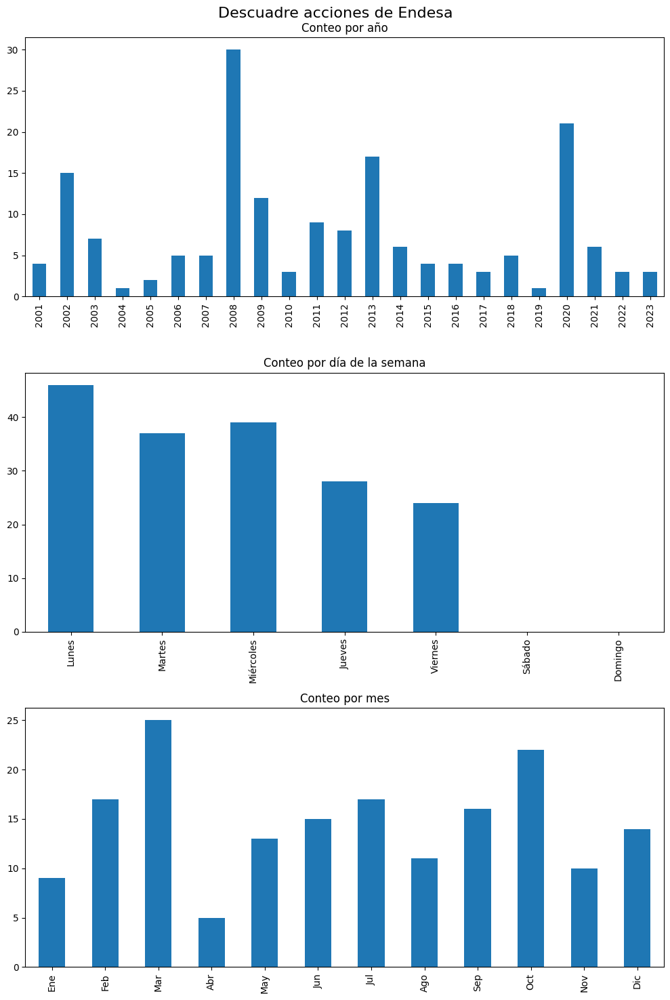

In [18]:
# Crear una figura con 3 subgráficas
fig, axs = plt.subplots(3, 1, figsize=(10, 15))

# Título general
fig.suptitle('Descuadre acciones de Endesa', fontsize=16)

# Convertir a serie y contar por año
serie_fechas = pd.Series(pd.to_datetime(lista_dias_superiores_2_pc))
conteo_anual = serie_fechas.dt.year.value_counts().sort_index()

# Gráfica por año
conteo_anual.plot(kind='bar', ax=axs[0], title='Conteo por año')


# Orden de los días de la semana en inglés y español
dias_semana_ingles = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
dias_semana_espanol = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Crear un diccionario de mapeo de inglés a español
mapeo_dias = dict(zip(dias_semana_ingles, dias_semana_espanol))

# Obtener los nombres de los días de la semana en inglés y luego mapearlos al español
dias_semana = serie_fechas.dt.day_name().map(mapeo_dias)

# Obtener el conteo de los días de la semana donde el retorno > 2%
conteo_dias_semana = dias_semana.value_counts().reindex(dias_semana_espanol).fillna(0)

# Gráfica por día de la semana
conteo_dias_semana.plot(kind='bar', ax=axs[1], title='Conteo por día de la semana')


# Obtener el conteo de los meses donde el retorno > 2%
conteo_meses = serie_fechas.dt.month.value_counts().sort_index()

# Nombres de los meses en español
nombres_meses = ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic']

# Reemplazar los números de los meses por los nombres en español
conteo_meses.index = nombres_meses

# Gráfica por mes
conteo_meses.plot(kind='bar', ax=axs[2], title='Conteo por mes')

# Ajustar el espacio entre las gráficas
plt.tight_layout()

# Ajustar el espacio para el título general
fig.subplots_adjust(top=0.95)

plt.show()

#### Descuadres con mayor cambio porcentual en las acciones de Endesa.

In [21]:
# Obtener las 5 filas con los mayores valores en la columna 'Diff_Percent'
top5 = cotizacion_Endesa.nlargest(5, 'Diff_Percent')

# Agregar un título y mostrar el DataFrame
top5.style.set_caption("Top 5 días con mayor cambio porcentual en las acciones de Endesa")

,Open,High,Low,Close,Adj Close,Volume,Diff_Percent
Date,,,,,,,
2005-09-06 00:00:00,21.250000,21.270000,20.299999,20.549999,2.932246,57627240,11.314824
2006-02-21 00:00:00,27.500000,27.940001,27.400000,27.549999,3.985776,51632444,7.927788
2006-09-26 00:00:00,31.709999,33.099998,31.650000,32.500000,4.931656,211188464,7.857141
2006-09-27 00:00:00,35.009998,35.250000,34.549999,35.000000,5.311014,35571756,7.723072
2020-05-05 00:00:00,21.000000,21.000000,20.240000,20.240000,15.341811,1102381,7.416884


Si observamos uno a uno los descuadres más importantes, encontramos un patrón de noticias que respaldan cada fecha, si bien pueden no ser fácilmente predecibles:

##### 2005-09-06

![](./data/Imagenes/noticia_1.png)

##### 2006-02-21
![](./data/Imagenes/noticia_2.png)

##### 2006-09-26 y 2006-09-27
![](./data/Imagenes/noticia_3.png)

##### 2020-05-05
![](./data/Imagenes/noticia_4.png)


#### Descuadres con menor cambio porcentual en las acciones de Endesa.

In [22]:
# Obtener las 5 filas con los menores valores en la columna 'Diff_Percent'
bottom5 = cotizacion_Endesa.nsmallest(5, 'Diff_Percent')

# Agregar un título y mostrar el DataFrame
bottom5.style.set_caption("Top 5 días con menor cambio porcentual en las acciones de Endesa")

,Open,High,Low,Close,Adj Close,Volume,Diff_Percent
Date,,,,,,,
2014-10-29 00:00:00,15.800000,16.000000,14.890000,15.130000,8.196056,9657735,-45.704467
2009-03-16 00:00:00,14.040000,15.050000,14.020000,14.700000,3.387702,3415061,-31.378296
2016-06-24 00:00:00,14.965000,16.465000,14.690000,16.165001,9.367685,3388533,-15.116274
2008-10-10 00:00:00,18.209999,20.740000,18.010000,18.629999,3.055947,1896132,-9.267567
2006-07-03 00:00:00,25.209999,25.400000,25.110001,25.260000,3.833035,14952236,-7.282094


Eventos como la devolución de cantidades mal cobradas afectan de forma negativa, como en el segundo caso.

![](./data/Imagenes/noticia_7.png)

Otro efecto interesante es el de los dividendos, que podemos comprobar gráficamente mediante un formato de 'velas', que tiene en cuenta todos los valores del dataframe y nos ayuda a detectar grandes cambios en los valores de un día a otro. Por ejemplo, en este caso estamos observando el reparto del que se consideraba el 'dividendo más grande de la historia de España'.

![](./data/Imagenes/noticia_8.png)

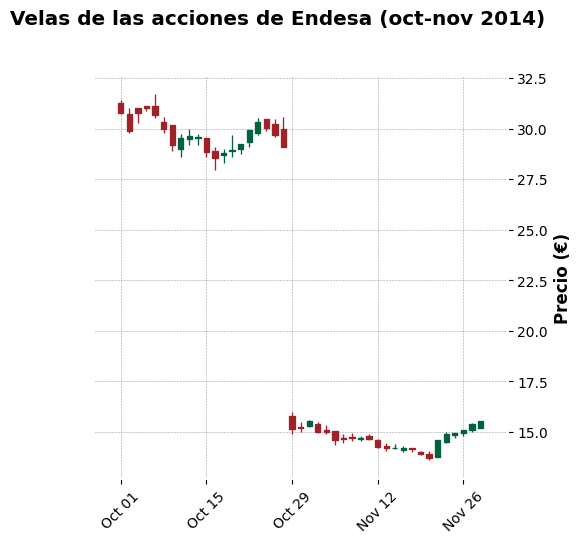

In [23]:
# Filtrar los datos para el rango de fechas especificado y graficar
mpf.plot(cotizacion_Endesa[(cotizacion_Endesa.index >= '2014-10-01') & (cotizacion_Endesa.index <= '2014-11-30')], 
         type='candle', 
         style='charles', 
         title='Velas de las acciones de Endesa (oct-nov 2014)', 
         ylabel='Precio (€)', 
         volume=False, 
         figratio=(10,10),
         warn_too_much_data=10000)

En cuanto el accionista pierde el derecho de recibir un dividendo (fecha ex-dividendo), la acción baja aproximadamente el mismo valor que el propio dividendo. Aun así, es interesante conocer el efecto de este reparto en cómo se comporta el precio del valor.

Comprobamos que existe, entre otros muchos, el correspondiente al 29 de octubre que observamos más arriba.

In [24]:
dividendos_Endesa.loc['2014-10-28':'2014-10-30']

Date
2014-10-29 00:00:00+01:00    13.795
Name: Dividends, dtype: float64

Y que la diferencia entre el cierre del día 28 y la apertura del 29 coincide, aproximadamente, con el valor del dividendo.

In [25]:
cotizacion_Endesa.loc['2014-10-28':'2014-10-30']

,Open,High,Low,Close,Adj Close,Volume,Diff_Percent
Date,,,,,,,
2014-10-28,29.969999,30.580,29.10,29.10,8.290855,5616528,0.909086
2014-10-29,15.800000,16.000,14.89,15.13,8.196056,9657735,-45.704467
2014-10-30,15.250000,15.495,15.01,15.22,8.244808,2681242,0.793125


### ACCIONES DE IBERDROLA

### ACCIONES DE ACCIONA ENERGÍAS

### ACCIONES DE SOLARIA

### ACCIONES DE NATURGY

## DIVIDENDOS

Un dividendo de una empresa es una distribución de las ganancias de esa empresa a sus accionistas. Las empresas públicas que cotizan en bolsa suelen pagar dividendos a los accionistas como una forma de compartir los beneficios generados. Estos pagos se realizan periódicamente, generalmente trimestral o anualmente, y representan una porción de las utilidades de la empresa.

### ACCIONES DE ENDESA

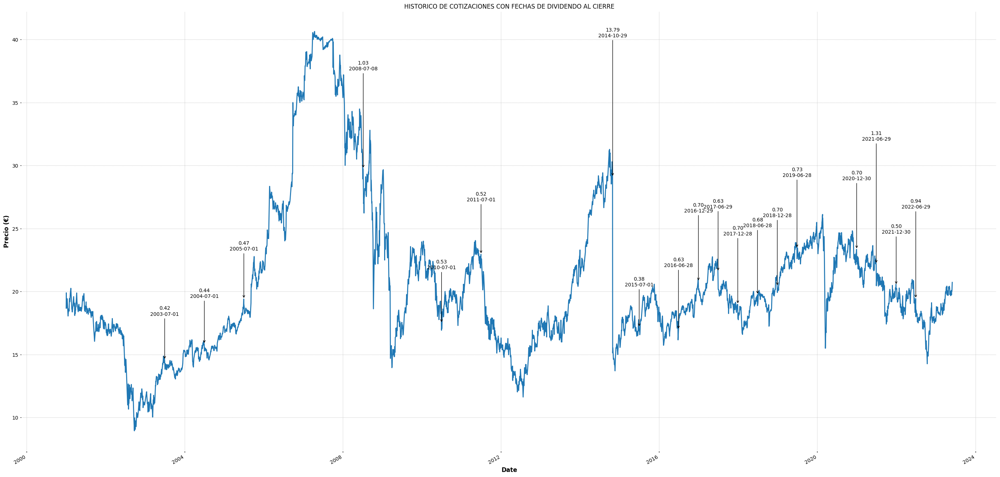

In [32]:
fechas_str = [ts.strftime('%Y-%m-%d') for ts in dividendos_Endesa.index.tolist()]
sizes = dividendos_Endesa.tolist()

plt.figure(figsize=(35,18))
ax = cotizacion_Endesa['Close'].plot(title='HISTORICO DE COTIZACIONES CON FECHAS DE DIVIDENDO AL CIERRE', ylabel='Precio (€)')

for idx, date in enumerate(fechas_str):
    previous_close = cotizacion_Endesa['Close'].get(pd.Timestamp(date) - pd.Timedelta(days=1))
    if previous_close is not None:
        end_point = previous_close + sizes[idx] * 7
        
        if sizes[idx] > 1.5:
            end_point = previous_close + 1.5 * 7

        # Agrega la fecha debajo del valor
        ax.annotate(f'{sizes[idx]:.2f}\n{date}', xy=(date, previous_close), xytext=(date, end_point + 0.5), 
                    arrowprops=dict(facecolor='red', arrowstyle="->"),
                    horizontalalignment='center', verticalalignment='bottom')

plt.show()

Si los valores de los dividendos se 'restan aritméticamente' del precio de la acción, podríamos pensar que su efecto se puede revertir a la hora de manejar la serie temporal, teniendo en cuenta restarle el valor total de los dividendos para obtener la versión real.

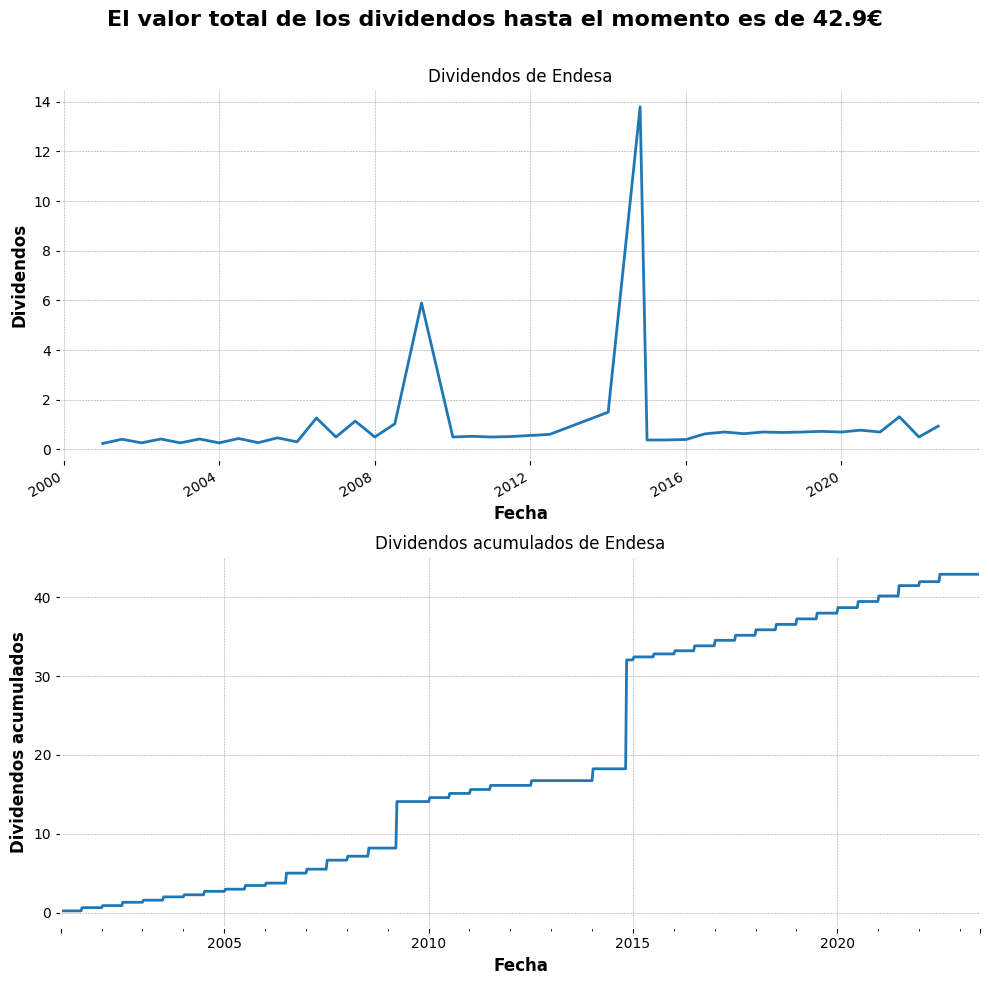

In [43]:
# Re-muestrea los datos de dividendos a una frecuencia diaria, sumando los valores de cada día.
# Llena los días sin datos con 0.
dividendos_resampled = dividendos_Endesa.resample('D').sum().fillna(0)

# Calcula la suma acumulada de los dividendos re-muestreados.
dividendos_acumulados = dividendos_resampled.cumsum()

# Elimina la información de zona horaria del índice de dividendos acumulados.
dividendos_acumulados.index = dividendos_acumulados.index.tz_localize(None)

# Define la fecha final para el nuevo índice.
end_date = pd.Timestamp('2023-06-30').tz_localize(None)

# Crea un nuevo índice que va desde la primera fecha en dividendos acumulados hasta la fecha final.
new_index = pd.date_range(dividendos_acumulados.index[0], end_date)

# Re-indexa los dividendos acumulados para que tenga el nuevo índice.
# Llena las fechas en el nuevo índice que no están en el índice original con el último valor válido anterior.
dividendos_acumulados = dividendos_acumulados.reindex(new_index, method='ffill')

# Crear una figura con 2 subgráficas
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Título general
fig.suptitle(f"El valor total de los dividendos hasta el momento es de {dividendos_Endesa.sum().round(2)}€", fontsize=16)

# Gráfica de dividendos de Endesa
dividendos_Endesa.plot(ax=axs[0])
axs[0].set_title('Dividendos de Endesa')
axs[0].set_xlabel('Fecha')
axs[0].set_ylabel('Dividendos')

# Gráfica de dividendos acumulados de Endesa
dividendos_acumulados.plot(ax=axs[1])
axs[1].set_title('Dividendos acumulados de Endesa')
axs[1].set_xlabel('Fecha')
axs[1].set_ylabel('Dividendos acumulados')

# Ajustar el espacio entre las gráficas
plt.tight_layout()

# Ajustar el espacio para el título general
fig.subplots_adjust(top=0.9)

plt.show()

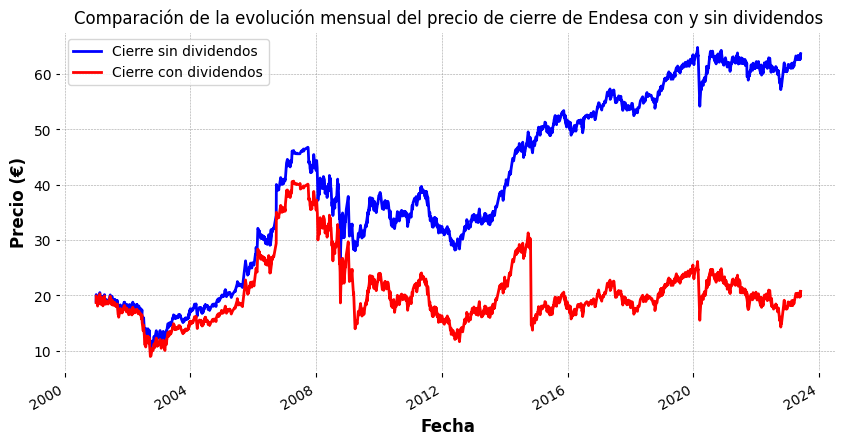

In [57]:
# Elimina la información de zona horaria del índice de dividendos acumulados.
dividendos_acumulados.index = dividendos_acumulados.index.tz_localize(None)

# Re-indexa los dividendos acumulados para que coincida con el índice de cotización.
# Llena las fechas en el índice de cotización que no están en el índice de dividendos acumulados con 0.
# Añade los dividendos acumulados al precio de cierre de la cotización.
cotizacion_Endesa['Close_Dividendo'] = cotizacion_Endesa['Close']
cotizacion_Endesa['Close_Dividendo'] += dividendos_acumulados.reindex(cotizacion_Endesa.index, fill_value=0)

# Convierte las fechas en el índice de dividendos a cadenas en el formato 'YYYY-MM-DD'.
fechas_str = [ts.strftime('%Y-%m-%d') for ts in dividendos_Endesa.index.tolist()]

# Crear una nueva figura
plt.figure(figsize=(10, 5))

# Gráfica de 'Close_Dividendo' y 'Close' juntos
cotizacion_Endesa['Close_Dividendo'].plot(color='blue', label='Cierre sin dividendos')
cotizacion_Endesa['Close'].plot(color='red', label='Cierre con dividendos')
plt.title('Comparación de la evolución mensual del precio de cierre de Endesa con y sin dividendos')
plt.ylabel('Precio (€)')
plt.xlabel('Fecha')
plt.legend()

plt.show()

### ACCIONES DE IBERDROLA

### ACCIONES DE ACCIONA ENERGÍAS

### ACCIONES DE SOLARIA

### ACCIONES DE NATURGY

## Se propone:
Probar dos métodos de predicción de serie temporal que predigan el precio de la acción 12 meses más adelante de la última fecha conocida (mes del 2023-06)

## XGBoost Regressor con Cross Validation e hiperparametrización

Preparamos el dataframe obteniendo 'lags', es decir, pasos para atrás y mantenemos la columna "Close" como variable independiente.

In [20]:
num_lags = 20
for lag in range(1, num_lags + 1):
    cotizacion_mensual[f'lag_{lag}'] = cotizacion_mensual['Close'].shift(lag)

cotizacion_mensual = cotizacion_mensual.dropna()

In [21]:
cotizacion_mensual.head()

,Close,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,lag_8,lag_9,...,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20
Date,,,,,,,,,,,,,,,,,,,,,
2002-09-30,12.5325,13.4125,14.1025,17.0890,17.723999,18.104001,18.154000,17.713999,17.774001,18.010000,...,17.720000,17.449999,19.015000,19.199999,19.539999,18.920000,19.119999,19.115000,19.580000,18.920000
2002-10-31,11.3825,12.5325,13.4125,14.1025,17.089000,17.723999,18.104001,18.154000,17.713999,17.774001,...,18.460000,17.720000,17.449999,19.015000,19.199999,19.539999,18.920000,19.119999,19.115000,19.580000
2002-11-30,12.5775,11.3825,12.5325,13.4125,14.102500,17.089000,17.723999,18.104001,18.154000,17.713999,...,18.010000,18.460000,17.720000,17.449999,19.015000,19.199999,19.539999,18.920000,19.119999,19.115000
2002-12-31,12.5125,12.5775,11.3825,12.5325,13.412500,14.102500,17.089000,17.723999,18.104001,18.154000,...,17.774001,18.010000,18.460000,17.720000,17.449999,19.015000,19.199999,19.539999,18.920000,19.119999
2003-01-31,12.9665,12.5125,12.5775,11.3825,12.532500,13.412500,14.102500,17.089000,17.723999,18.104001,...,17.713999,17.774001,18.010000,18.460000,17.720000,17.449999,19.015000,19.199999,19.539999,18.920000


### Creamos ventanas para la cross validation, que utilizaremos más adelante en la prueba de otros modelos

In [22]:
#tscv = TimeSeriesSplit(n_splits=5) # No personaliza suficientemente los cortes

def custom_time_series_split(df, train_months, test_months):
    ventanas = []
    
    total_months = train_months + test_months
    
    n_splits = int((len(df) - train_months) / test_months)
    
    for split in range(n_splits):
        start_train = split * test_months
        end_train = start_train + train_months
        
        start_test = end_train
        end_test = start_test + test_months
        
        if end_test > len(df):
            end_test = len(df)
        
        ventanas.append((
            df.index[start_train],
            df.index[end_train - 1], 
            df.index[start_test],
            df.index[end_test - 1] ))
    
    return ventanas

train_months = 36
test_months = 12

ventanas = custom_time_series_split(cotizacion_mensual, train_months, test_months)

for i, ventana in enumerate(ventanas):
    print(f"Ventana {i}: {[timest.strftime('%Y-%m-%d') for timest in ventana]}")

Ventana 0: ['2002-09-30', '2005-08-31', '2005-09-30', '2006-08-31']
Ventana 1: ['2003-09-30', '2006-08-31', '2006-09-30', '2007-08-31']
Ventana 2: ['2004-09-30', '2007-08-31', '2007-09-30', '2008-08-31']
Ventana 3: ['2005-09-30', '2008-08-31', '2008-09-30', '2009-08-31']
Ventana 4: ['2006-09-30', '2009-08-31', '2009-09-30', '2010-08-31']
Ventana 5: ['2007-09-30', '2010-08-31', '2010-09-30', '2011-08-31']
Ventana 6: ['2008-09-30', '2011-08-31', '2011-09-30', '2012-08-31']
Ventana 7: ['2009-09-30', '2012-08-31', '2012-09-30', '2013-08-31']
Ventana 8: ['2010-09-30', '2013-08-31', '2013-09-30', '2014-08-31']
Ventana 9: ['2011-09-30', '2014-08-31', '2014-09-30', '2015-08-31']
Ventana 10: ['2012-09-30', '2015-08-31', '2015-09-30', '2016-08-31']
Ventana 11: ['2013-09-30', '2016-08-31', '2016-09-30', '2017-08-31']
Ventana 12: ['2014-09-30', '2017-08-31', '2017-09-30', '2018-08-31']
Ventana 13: ['2015-09-30', '2018-08-31', '2018-09-30', '2019-08-31']
Ventana 14: ['2016-09-30', '2019-08-31', '20

Obtenemos 30 combinaciones distintas para la búsqueda, dentro del marco definido en 'space'

In [23]:
space = {
    'max_depth': hp.choice('max_depth', np.arange(3, 10, dtype=int)),
    'min_child_weight': hp.quniform('min_child_weight', 1, 6, 1),
    'subsample': hp.uniform('subsample', 0.6, 1),
    'n_estimators': hp.quniform('n_estimators', 100, 500, 100),
    'learning_rate': hp.uniform('learning_rate', 0.05, 0.2)
}

samples = [sample(space) for _ in range(30)]

for sample_ in samples:
    sample_['max_depth'] = int(sample_['max_depth'])
    sample_['min_child_weight'] = int(sample_['min_child_weight'])
    sample_['n_estimators'] = int(sample_['n_estimators'])

for i, params in enumerate(samples):
    print(f"Sample {i+1}: {params}")

Sample 1: {'learning_rate': 0.16641910935709014, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8480975562886519}
Sample 2: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Sample 3: {'learning_rate': 0.19516598887334313, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.8276635184881016}
Sample 4: {'learning_rate': 0.1282900409440027, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.8748419873566524}
Sample 5: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Sample 6: {'learning_rate': 0.18990237365327778, 'max_depth': 9, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.8133309015535601}
Sample 7: {'learning_rate': 0.08566207896193731, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.6210736406890162}
Sample 

In [24]:
lags = [5, 10, 20]

resultados_xgb = []
for start_train_date, end_train_date, start_test_date, end_test_date in ventanas:
    for hyper in samples:
        for lg in lags:
            print(f"Probamos con Train desde {start_train_date} hasta {end_train_date} y con Test desde {start_test_date} hasta {end_test_date}")
            print(f"Con {lg} lags.")
            print(f"Con los siguientes hiperparámetros: {hyper}")

            train = cotizacion_mensual[(cotizacion_mensual.index >= start_train_date) & (cotizacion_mensual.index <= end_train_date)]
            test = cotizacion_mensual[(cotizacion_mensual.index > end_train_date) & (cotizacion_mensual.index <= end_test_date)]

            X_train, y_train = train.drop('Close', axis=1), train['Close']
            X_test, y_test = test.drop('Close', axis=1), test['Close'].tolist()
            
            X_train = X_train[X_train.columns[:lg]]
            X_test = X_test[X_test.columns[:lg]]

            model = xgb.XGBRegressor(**hyper)
            model.fit(X_train, y_train)

            preds = model.predict(X_test)
            mse = mean_squared_error(y_test, preds)
            print(f"Obteniendo un MSE de: {mse}")
            print("*"*50)

            iteracion = {
                'start_train_date': start_train_date, 
                'end_train_date': end_train_date, 
                'start_test_date': start_test_date, 
                'end_test_date': end_test_date,
                'lags': lg,
                'hyper': hyper,
                'real': y_test,
                'preds': preds,
                'mse': mse 
            }
            resultados_xgb.append(iteracion)

resultados_xgb = pd.DataFrame(resultados_xgb)

Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16641910935709014, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8480975562886519}
Obteniendo un MSE de: 56.70494291162609
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16641910935709014, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8480975562886519}
Obteniendo un MSE de: 47.13074960078553
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'lear

Obteniendo un MSE de: 51.9991599243497
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16932913956746543, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8120835609071293}
Obteniendo un MSE de: 52.04534277419171
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16932913956746543, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8120835609071293}
Obteniendo un MSE de: 46.790404146897366
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30

Obteniendo un MSE de: 60.259247078521646
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06637757487725565, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6465022778829635}
Obteniendo un MSE de: 45.139001137738205
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06637757487725565, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6465022778829635}
Obteniendo un MSE de: 45.70205021659825
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-

Obteniendo un MSE de: 54.04441822226094
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14197969085159384, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.9674032489040755}
Obteniendo un MSE de: 58.990313779088275
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14197969085159384, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.9674032489040755}
Obteniendo un MSE de: 46.502755304645355
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-

Obteniendo un MSE de: 53.55276693569837
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15154446024792112, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.7586972350490817}
Obteniendo un MSE de: 47.31332317769617
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-30 00:00:00 hasta 2006-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15154446024792112, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.7586972350490817}
Obteniendo un MSE de: 45.865597007216024
**************************************************
Probamos con Train desde 2002-09-30 00:00:00 hasta 2005-08-31 00:00:00 y con Test desde 2005-09-3

Obteniendo un MSE de: 154.52025580930328
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-30 00:00:00 hasta 2007-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16932913956746543, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8120835609071293}
Obteniendo un MSE de: 174.35047547163472
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-30 00:00:00 hasta 2007-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16932913956746543, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8120835609071293}
Obteniendo un MSE de: 174.29066720243938
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09

Obteniendo un MSE de: 165.7635698980408
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-30 00:00:00 hasta 2007-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06637757487725565, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6465022778829635}
Obteniendo un MSE de: 178.6204056861375
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-30 00:00:00 hasta 2007-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06637757487725565, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6465022778829635}
Obteniendo un MSE de: 172.30740597085477
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-3

Obteniendo un MSE de: 167.19135452006924
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-30 00:00:00 hasta 2007-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14197969085159384, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.9674032489040755}
Obteniendo un MSE de: 167.2262967533069
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09-30 00:00:00 hasta 2007-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14197969085159384, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.9674032489040755}
Obteniendo un MSE de: 167.36004183946926
**************************************************
Probamos con Train desde 2003-09-30 00:00:00 hasta 2006-08-31 00:00:00 y con Test desde 2006-09

Obteniendo un MSE de: 9.571831498865736
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 9.621172070316595
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 10.529565611995146
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-

Obteniendo un MSE de: 11.999972556198585
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18026707004781728, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.858670048109089}
Obteniendo un MSE de: 11.273326910157175
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.10893774440733175, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.7440705099538294}
Obteniendo un MSE de: 10.015950313024586
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-

Obteniendo un MSE de: 10.502401227276495
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06637757487725565, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6465022778829635}
Obteniendo un MSE de: 10.414539817529102
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19620612210576555, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 400, 'subsample': 0.9647365785368756}
Obteniendo un MSE de: 9.726819121657
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 

Obteniendo un MSE de: 16.373495870851382
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06663802248029241, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9448813058062155}
Obteniendo un MSE de: 9.053327507699711
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-30 00:00:00 hasta 2008-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06663802248029241, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9448813058062155}
Obteniendo un MSE de: 9.038619615775813
**************************************************
Probamos con Train desde 2004-09-30 00:00:00 hasta 2007-08-31 00:00:00 y con Test desde 2007-09-3

Obteniendo un MSE de: 14.896535903888141
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16641910935709014, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8480975562886519}
Obteniendo un MSE de: 12.625198260990475
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 14.274669109033075
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09

Obteniendo un MSE de: 14.935170526857798
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18026707004781728, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.858670048109089}
Obteniendo un MSE de: 15.70291002499715
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18026707004781728, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.858670048109089}
Obteniendo un MSE de: 17.855753000737725
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-3

Obteniendo un MSE de: 16.24043700902392
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19620612210576555, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 400, 'subsample': 0.9647365785368756}
Obteniendo un MSE de: 15.237077292355005
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19620612210576555, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 400, 'subsample': 0.9647365785368756}
Obteniendo un MSE de: 12.800450147515077
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-

Obteniendo un MSE de: 14.67327972651018
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06663802248029241, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9448813058062155}
Obteniendo un MSE de: 14.658009630934602
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-30 00:00:00 hasta 2009-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.09972884042877103, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6578490754263783}
Obteniendo un MSE de: 16.30100919750223
**************************************************
Probamos con Train desde 2005-09-30 00:00:00 hasta 2008-08-31 00:00:00 y con Test desde 2008-09-3

Obteniendo un MSE de: 6.937322395761331
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 2.6595269059367443
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 6.663299318611056
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-

Obteniendo un MSE de: 8.635655333002527
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18026707004781728, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.858670048109089}
Obteniendo un MSE de: 1.928320855775065
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18026707004781728, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.858670048109089}
Obteniendo un MSE de: 16.074769643139323
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30

Obteniendo un MSE de: 1.358708246566161
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19620612210576555, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 400, 'subsample': 0.9647365785368756}
Obteniendo un MSE de: 12.957855934713264
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 4.421053180105873
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-3

Obteniendo un MSE de: 11.345595051817833
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.09972884042877103, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6578490754263783}
Obteniendo un MSE de: 5.402854402601377
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-30 00:00:00 hasta 2010-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.09972884042877103, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6578490754263783}
Obteniendo un MSE de: 1.9629727800730297
**************************************************
Probamos con Train desde 2006-09-30 00:00:00 hasta 2009-08-31 00:00:00 y con Test desde 2009-09-

Obteniendo un MSE de: 3.149161364559864
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 2.4587149839900295
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.17169412272573742, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9288796186347266}
Obteniendo un MSE de: 3.4227107212926113
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-

Obteniendo un MSE de: 3.0010075127787204
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.10893774440733175, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.7440705099538294}
Obteniendo un MSE de: 4.3261346796860645
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.10893774440733175, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.7440705099538294}
Obteniendo un MSE de: 2.864891708294536
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09

Obteniendo un MSE de: 2.7416802371740894
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 3.018780820705732
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 3.879443793710935
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-3

Obteniendo un MSE de: 4.568658664279629
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 3.629322358448121
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30 00:00:00 hasta 2011-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 2.0948557575864726
**************************************************
Probamos con Train desde 2007-09-30 00:00:00 hasta 2010-08-31 00:00:00 y con Test desde 2010-09-30

Obteniendo un MSE de: 5.737199504470958
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1282900409440027, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.8748419873566524}
Obteniendo un MSE de: 14.142331824918235
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 3.04341655627324
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 

Obteniendo un MSE de: 13.207729025476532
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 3.2405179590532462
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 4.954055278876043
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-

Obteniendo un MSE de: 8.569362961854898
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 2.153864168687798
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 4.001530757172361
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30

Obteniendo un MSE de: 5.670187326079105
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 11.726754231523769
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30 00:00:00 hasta 2012-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 2.580129505228761
**************************************************
Probamos con Train desde 2008-09-30 00:00:00 hasta 2011-08-31 00:00:00 y con Test desde 2011-09-30

Obteniendo un MSE de: 1.3272807833338744
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 1.1770191211612075
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 2.4681366701773704
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09

Obteniendo un MSE de: 1.1934311417613446
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 1.5301542605743395
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 3.0798819089295386
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09

Obteniendo un MSE de: 2.901522641087468
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16055094839130735, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6058676553299572}
Obteniendo un MSE de: 1.154124965268703
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 1.539850693074823
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30

Obteniendo un MSE de: 1.6520253016996003
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 2.1385390252012892
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-30 00:00:00 hasta 2013-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 1.049420368442506
**************************************************
Probamos con Train desde 2009-09-30 00:00:00 hasta 2012-08-31 00:00:00 y con Test desde 2012-09-3

Obteniendo un MSE de: 48.479578161052096
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1282900409440027, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.8748419873566524}
Obteniendo un MSE de: 50.618044397519384
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1282900409440027, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.8748419873566524}
Obteniendo un MSE de: 55.461080992616935
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-

Obteniendo un MSE de: 49.05391253589278
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14795236812721674, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7738712713921517}
Obteniendo un MSE de: 48.61234866686751
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 41.58298307735438
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30

Obteniendo un MSE de: 54.3974096369485
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16055094839130735, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6058676553299572}
Obteniendo un MSE de: 43.311489423225545
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.16055094839130735, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6058676553299572}
Obteniendo un MSE de: 47.40639322483624
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30

Obteniendo un MSE de: 52.548631738959365
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.147055580394587, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6378134836589506}
Obteniendo un MSE de: 54.44169470264316
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 00:00:00 hasta 2014-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.147055580394587, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6378134836589506}
Obteniendo un MSE de: 54.20718082943767
**************************************************
Probamos con Train desde 2010-09-30 00:00:00 hasta 2013-08-31 00:00:00 y con Test desde 2013-09-30 0

Obteniendo un MSE de: 11.040357002931822
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19516598887334313, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.8276635184881016}
Obteniendo un MSE de: 14.409140649220783
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19516598887334313, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.8276635184881016}
Obteniendo un MSE de: 20.51752144263983
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09

Obteniendo un MSE de: 11.066270170669563
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14795236812721674, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7738712713921517}
Obteniendo un MSE de: 15.150655190909454
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14795236812721674, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7738712713921517}
Obteniendo un MSE de: 27.410732066537594
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-0

Obteniendo un MSE de: 11.13116592469125
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 14.739098004236482
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 24.760123079398213
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09

Obteniendo un MSE de: 20.71281040063597
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.09972884042877103, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6578490754263783}
Obteniendo un MSE de: 13.615315260371462
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-30 00:00:00 hasta 2015-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.09972884042877103, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6578490754263783}
Obteniendo un MSE de: 25.53772699699877
**************************************************
Probamos con Train desde 2011-09-30 00:00:00 hasta 2014-08-31 00:00:00 y con Test desde 2014-09-

Obteniendo un MSE de: 0.8520107654720134
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19516598887334313, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.8276635184881016}
Obteniendo un MSE de: 2.038087238643634
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.19516598887334313, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.8276635184881016}
Obteniendo un MSE de: 0.9736956906485256
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-

Obteniendo un MSE de: 0.8604776475446299
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.10893774440733175, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.7440705099538294}
Obteniendo un MSE de: 3.034297250145709
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.10893774440733175, 'max_depth': 6, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.7440705099538294}
Obteniendo un MSE de: 1.314962082883712
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-3

Obteniendo un MSE de: 1.0891502241241882
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 2.922320146359109
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}
Obteniendo un MSE de: 1.4129904736149463
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-

Obteniendo un MSE de: 3.7705511309426796
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 1.169564277627564
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-30 00:00:00 hasta 2016-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 0.8427014269650067
**************************************************
Probamos con Train desde 2012-09-30 00:00:00 hasta 2015-08-31 00:00:00 y con Test desde 2015-09-3

Obteniendo un MSE de: 14.736220670782634
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 12.692996630355516
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 14.658295278925104
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09

Obteniendo un MSE de: 12.663908120468136
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06875579756219115, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6992809487853681}
Obteniendo un MSE de: 15.259698092988243
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06875579756219115, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6992809487853681}
Obteniendo un MSE de: 14.031408320546026
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-0

Obteniendo un MSE de: 15.492714220353447
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 17.45157635433031
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}
Obteniendo un MSE de: 19.004072146910627
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-3

Obteniendo un MSE de: 16.448782359601644
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 11.106600054868567
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09-30 00:00:00 hasta 2017-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 16.905493536501744
**************************************************
Probamos con Train desde 2013-09-30 00:00:00 hasta 2016-08-31 00:00:00 y con Test desde 2016-09

Obteniendo un MSE de: 0.912699642886972
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 1.037959372553241
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 0.864816358068417
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-3

Obteniendo un MSE de: 0.9577995316804749
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06875579756219115, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6992809487853681}
Obteniendo un MSE de: 0.7223683584702001
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06886576893327022, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 200, 'subsample': 0.6639127642633367}
Obteniendo un MSE de: 1.1417940699584779
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09

Obteniendo un MSE de: 0.7379989832769162
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 1.0653562602013553
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}
Obteniendo un MSE de: 0.932522847133089
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-3

Obteniendo un MSE de: 0.7029240202184939
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 1.4718710825077457
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-30 00:00:00 hasta 2018-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 0.7886790814010011
**************************************************
Probamos con Train desde 2014-09-30 00:00:00 hasta 2017-08-31 00:00:00 y con Test desde 2017-09-

Obteniendo un MSE de: 15.886439346121298
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18990237365327778, 'max_depth': 9, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.8133309015535601}
Obteniendo un MSE de: 20.162321675908768
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.18990237365327778, 'max_depth': 9, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.8133309015535601}
Obteniendo un MSE de: 16.79509337865309
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09

Obteniendo un MSE de: 14.905474449449306
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06886576893327022, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 200, 'subsample': 0.6639127642633367}
Obteniendo un MSE de: 17.151228269948135
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06886576893327022, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 200, 'subsample': 0.6639127642633367}
Obteniendo un MSE de: 20.210118028609642
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09

Obteniendo un MSE de: 15.219640044990934
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}
Obteniendo un MSE de: 16.289935279921924
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}
Obteniendo un MSE de: 19.077055448183895
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-3

Obteniendo un MSE de: 14.64326644635233
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 16.985428747683205
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-30 00:00:00 hasta 2019-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 19.512734530896886
**************************************************
Probamos con Train desde 2015-09-30 00:00:00 hasta 2018-08-31 00:00:00 y con Test desde 2018-09-

Obteniendo un MSE de: 3.77490711079696
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 4.815714149698274
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 4.573610091089151
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 

Obteniendo un MSE de: 3.8004192073185465
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 4.911178659899
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 4.397861183619926
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 0

Obteniendo un MSE de: 6.162470472109313
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 4.195129580988479
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 3.554327873871839
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30

Obteniendo un MSE de: 3.669850496199357
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 4.359640606155721
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 00:00:00 hasta 2020-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 4.140607464582739
**************************************************
Probamos con Train desde 2016-09-30 00:00:00 hasta 2019-08-31 00:00:00 y con Test desde 2019-09-30 

Obteniendo un MSE de: 0.22781114127989074
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 3.9816526156997103
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 4.090222574350938
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09

Obteniendo un MSE de: 5.212428425068633
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 2.099225660213659
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06875579756219115, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6992809487853681}
Obteniendo un MSE de: 4.37086966674219
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 

Obteniendo un MSE de: 4.730100246831828
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 1.4049796975031699
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}
Obteniendo un MSE de: 4.12216135822885
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 

Obteniendo un MSE de: 3.918704214038568
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 0.6897513203138078
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30 00:00:00 hasta 2021-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 4.469332203979683
**************************************************
Probamos con Train desde 2017-09-30 00:00:00 hasta 2020-08-31 00:00:00 y con Test desde 2020-09-30

Obteniendo un MSE de: 2.056295559565058
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1282900409440027, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.8748419873566524}
Obteniendo un MSE de: 4.673313726463843
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}
Obteniendo un MSE de: 0.8915001712999561
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30

Obteniendo un MSE de: 0.9715167079560564
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 2.2323776016355747
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.06838424922104341, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.9731491875107993}
Obteniendo un MSE de: 2.864610798300301
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09

Obteniendo un MSE de: 3.050026607680182
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 0.8260146580319572
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 10 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.15742852159588888, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.9792101478247632}
Obteniendo un MSE de: 2.498157975159021
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-3

Obteniendo un MSE de: 2.1040081384875706
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 20 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.1723108444080298, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 300, 'subsample': 0.8402411042970528}
Obteniendo un MSE de: 2.643081863927829
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-30 00:00:00 hasta 2022-08-31 00:00:00
Con 5 lags.
Con los siguientes hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}
Obteniendo un MSE de: 1.2540071955429448
**************************************************
Probamos con Train desde 2018-09-30 00:00:00 hasta 2021-08-31 00:00:00 y con Test desde 2021-09-3

In [25]:
resultados_xgb.head()

,start_train_date,end_train_date,start_test_date,end_test_date,lags,hyper,real,preds,mse
0,2002-09-30,2005-08-31,2005-09-30,2006-08-31,5,"{'learning_rate': 0.16641910935709014, 'max_de...","[24.371199961853026, 24.7062, 24.6712001525878...","[21.09575, 21.09575, 21.09575, 21.09575, 21.09...",56.704943
1,2002-09-30,2005-08-31,2005-09-30,2006-08-31,10,"{'learning_rate': 0.16641910935709014, 'max_de...","[24.371199961853026, 24.7062, 24.6712001525878...","[21.813812, 21.813812, 21.813812, 21.813812, 2...",47.130750
2,2002-09-30,2005-08-31,2005-09-30,2006-08-31,20,"{'learning_rate': 0.16641910935709014, 'max_de...","[24.371199961853026, 24.7062, 24.6712001525878...","[21.656593, 21.826174, 21.836142, 21.85313, 21...",57.305538
3,2002-09-30,2005-08-31,2005-09-30,2006-08-31,5,"{'learning_rate': 0.17169412272573742, 'max_de...","[24.371199961853026, 24.7062, 24.6712001525878...","[21.801603, 21.801603, 21.801603, 21.801603, 2...",47.284918
4,2002-09-30,2005-08-31,2005-09-30,2006-08-31,10,"{'learning_rate': 0.17169412272573742, 'max_de...","[24.371199961853026, 24.7062, 24.6712001525878...","[21.922392, 21.922392, 21.922392, 21.922392, 2...",45.772771


### Las mejores gráficas resultantes para cada rango de fechas es el siguiente:

Índice: 13
Fecha de inicio de TEST: 2005-09-30 00:00:00
Fecha de finalización de TEST: 2006-08-31 00:00:00
Lags utilizados: 10
MSE más bajo: 44.28621017649334
Hiperparámetros: {'learning_rate': 0.14914302394765203, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8204749455349923}


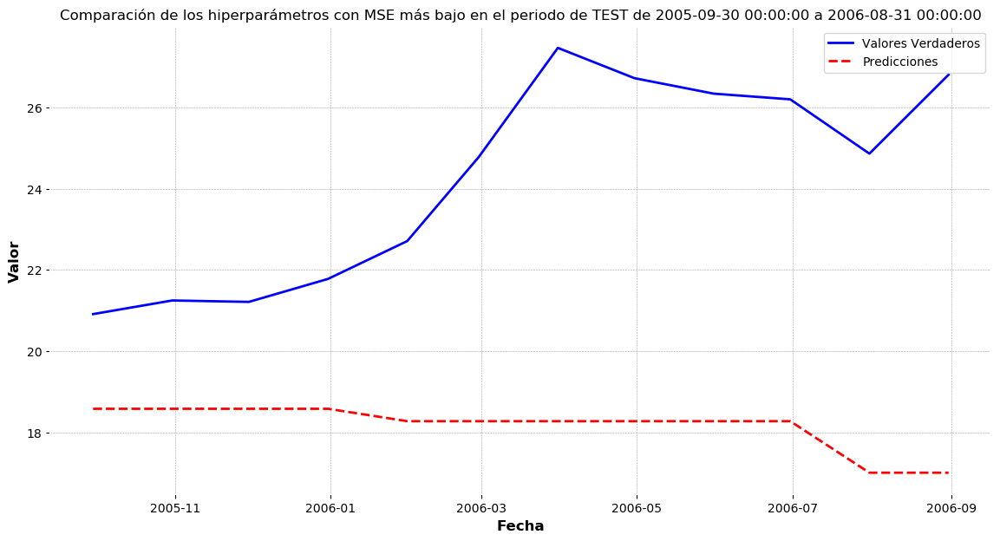

**************************************************
Índice: 152
Fecha de inicio de TEST: 2006-09-30 00:00:00
Fecha de finalización de TEST: 2007-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 142.61728004343078
Hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}


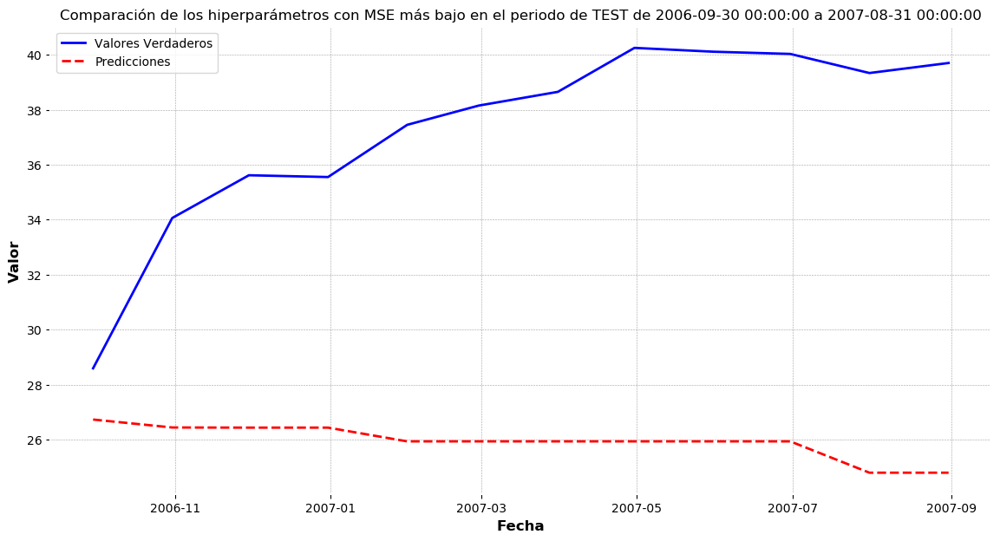

**************************************************
Índice: 210
Fecha de inicio de TEST: 2007-09-30 00:00:00
Fecha de finalización de TEST: 2008-08-31 00:00:00
Lags utilizados: 5
MSE más bajo: 7.5347266774967885
Hiperparámetros: {'learning_rate': 0.14795236812721674, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7738712713921517}


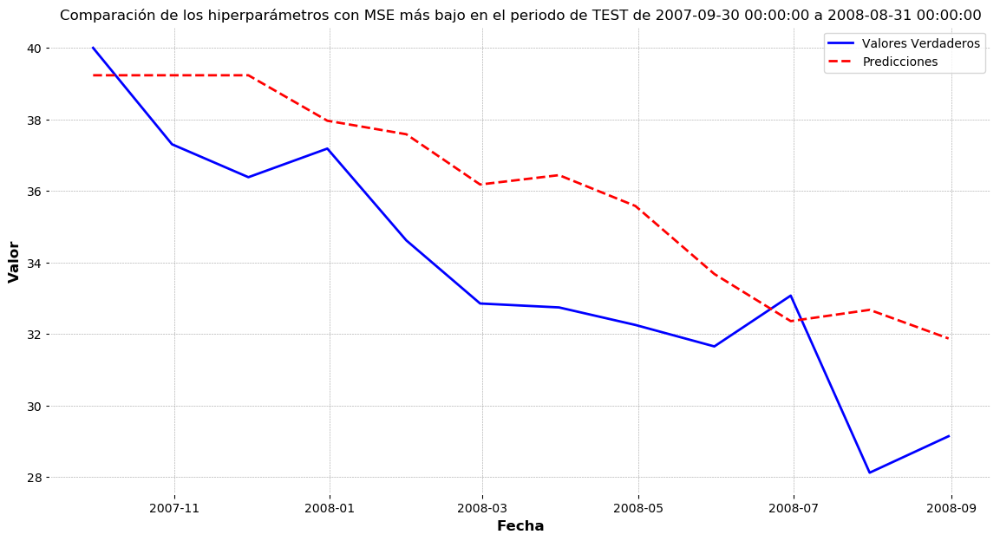

**************************************************
Índice: 338
Fecha de inicio de TEST: 2008-09-30 00:00:00
Fecha de finalización de TEST: 2009-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 9.050004747635581
Hiperparámetros: {'learning_rate': 0.14197969085159384, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 300, 'subsample': 0.9674032489040755}


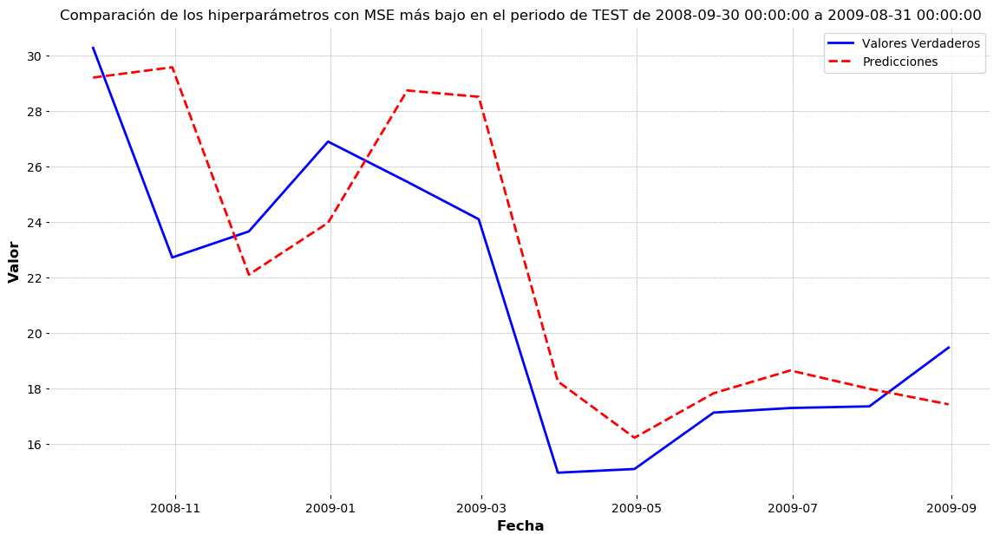

**************************************************
Índice: 379
Fecha de inicio de TEST: 2009-09-30 00:00:00
Fecha de finalización de TEST: 2010-08-31 00:00:00
Lags utilizados: 10
MSE más bajo: 0.9229394206010996
Hiperparámetros: {'learning_rate': 0.08566207896193731, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.6210736406890162}


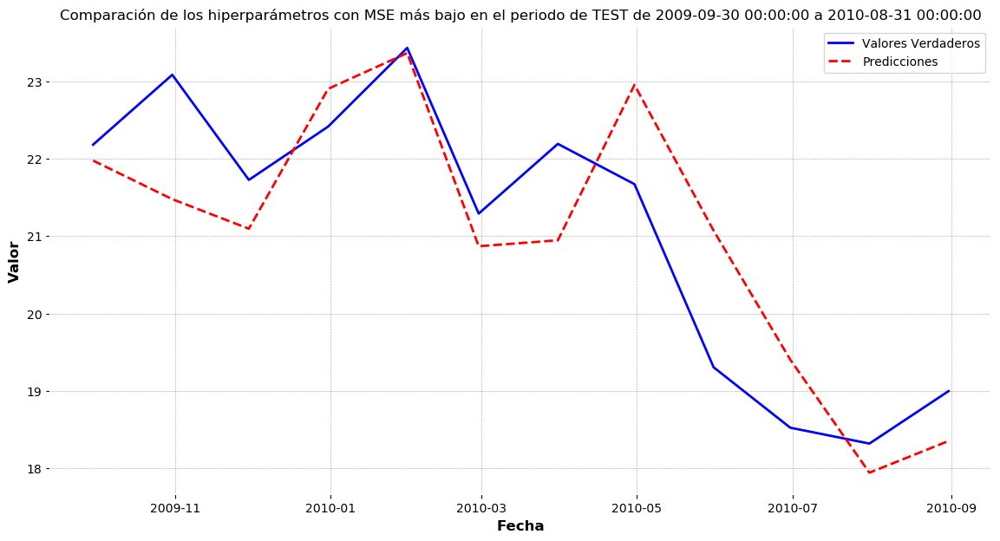

**************************************************
Índice: 510
Fecha de inicio de TEST: 2010-09-30 00:00:00
Fecha de finalización de TEST: 2011-08-31 00:00:00
Lags utilizados: 5
MSE más bajo: 1.5663242899007888
Hiperparámetros: {'learning_rate': 0.1755496631570485, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9413773923699095}


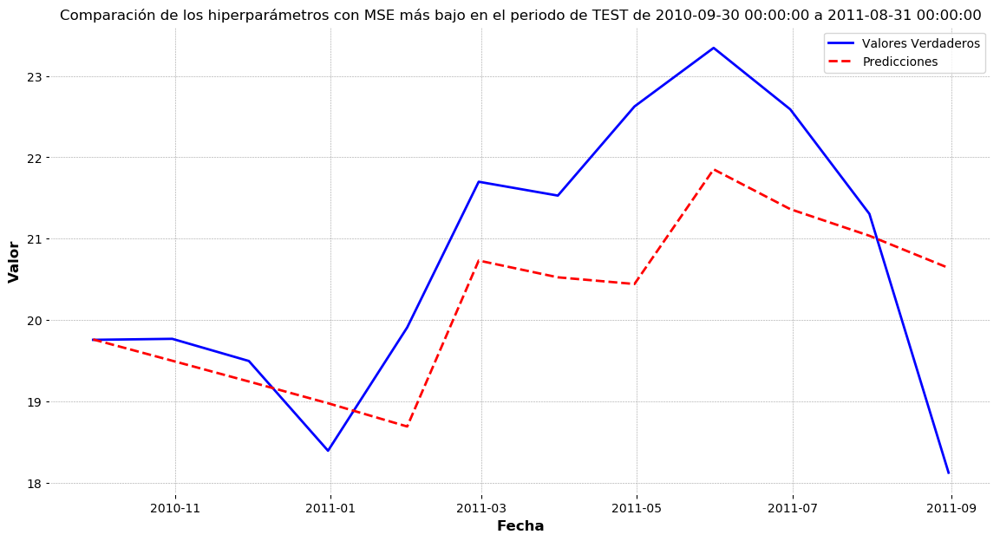

**************************************************
Índice: 564
Fecha de inicio de TEST: 2011-09-30 00:00:00
Fecha de finalización de TEST: 2012-08-31 00:00:00
Lags utilizados: 5
MSE más bajo: 1.725516255500626
Hiperparámetros: {'learning_rate': 0.18026707004781728, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 200, 'subsample': 0.858670048109089}


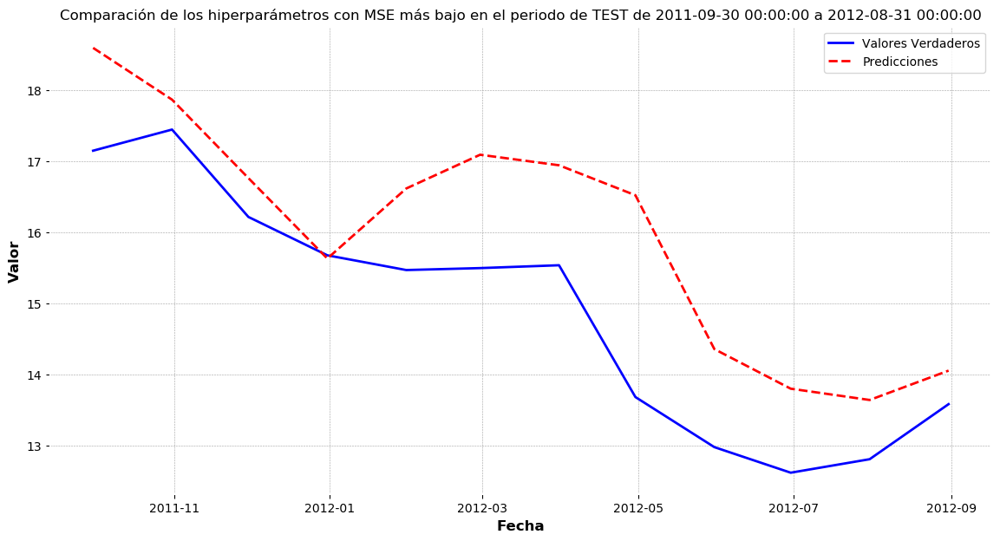

**************************************************
Índice: 680
Fecha de inicio de TEST: 2012-09-30 00:00:00
Fecha de finalización de TEST: 2013-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 0.8391977634578458
Hiperparámetros: {'learning_rate': 0.19620612210576555, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 400, 'subsample': 0.9647365785368756}


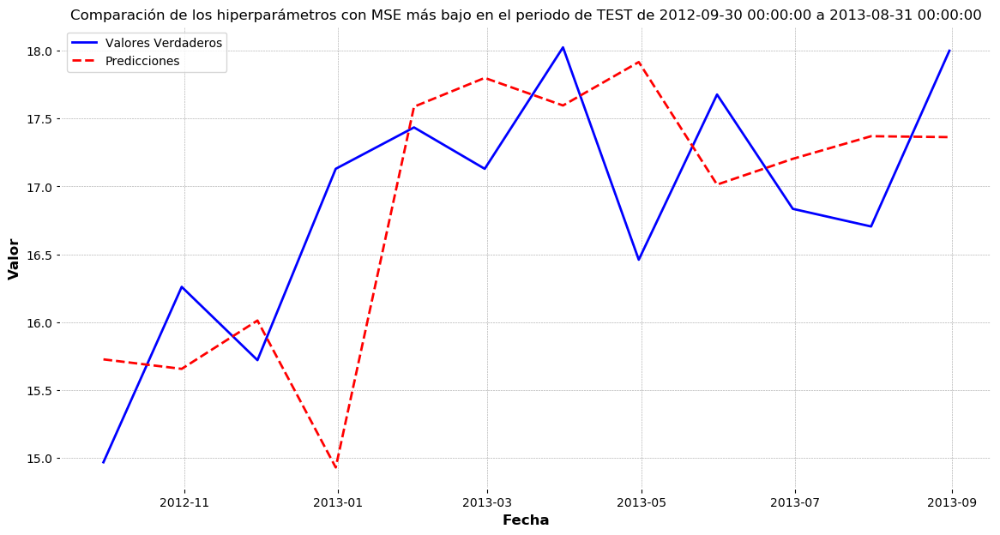

**************************************************
Índice: 785
Fecha de inicio de TEST: 2013-09-30 00:00:00
Fecha de finalización de TEST: 2014-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 38.279963423367015
Hiperparámetros: {'learning_rate': 0.0554885986145538, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 400, 'subsample': 0.8088979596560519}


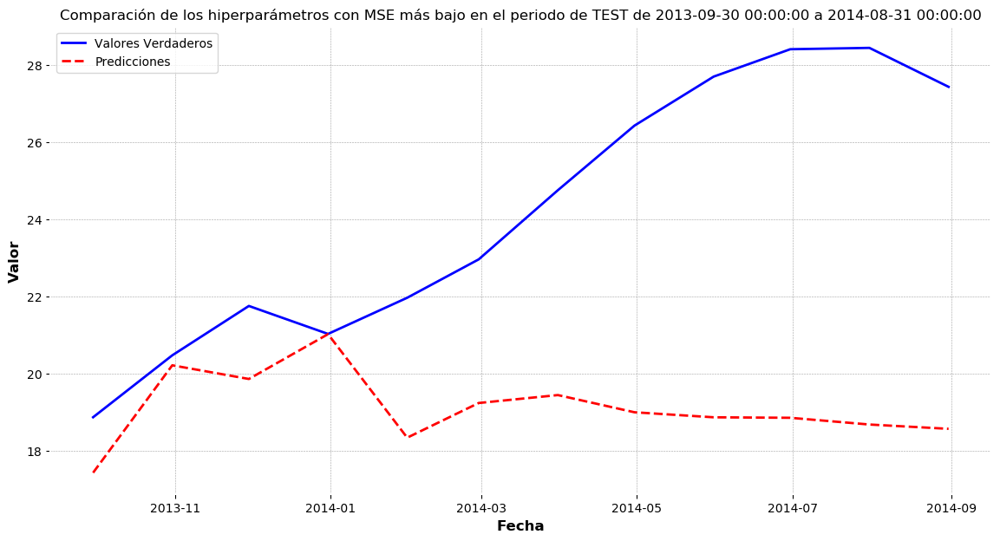

**************************************************
Índice: 852
Fecha de inicio de TEST: 2014-09-30 00:00:00
Fecha de finalización de TEST: 2015-08-31 00:00:00
Lags utilizados: 5
MSE más bajo: 10.641248502608384
Hiperparámetros: {'learning_rate': 0.14063038174576864, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.6102482078440962}


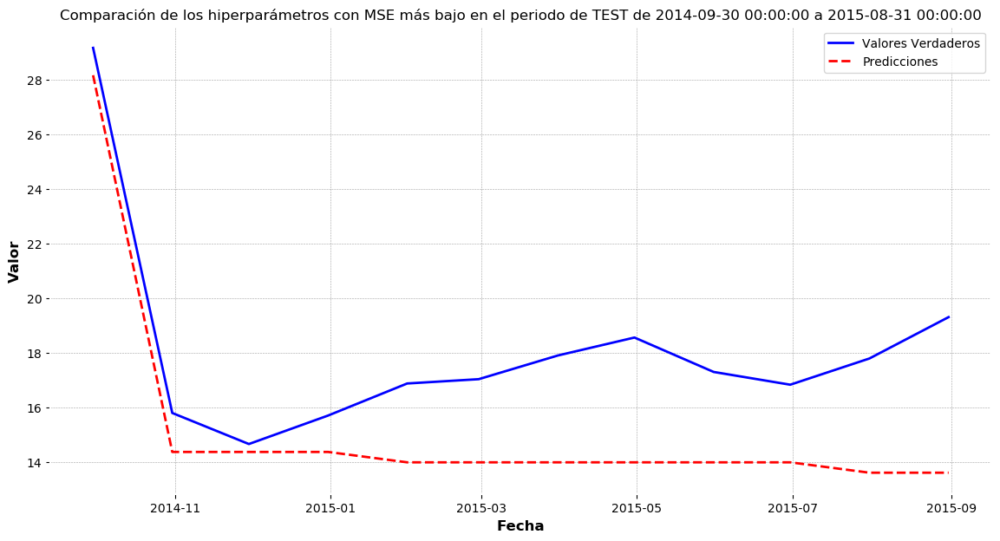

**************************************************
Índice: 956
Fecha de inicio de TEST: 2015-09-30 00:00:00
Fecha de finalización de TEST: 2016-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 0.8239453258762642
Hiperparámetros: {'learning_rate': 0.16055094839130735, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 300, 'subsample': 0.6058676553299572}


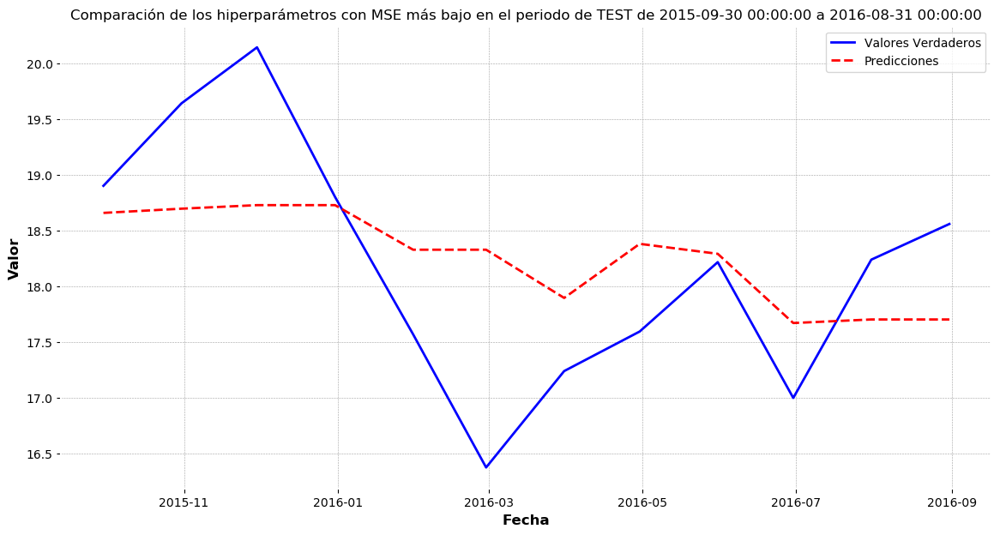

**************************************************
Índice: 1071
Fecha de inicio de TEST: 2016-09-30 00:00:00
Fecha de finalización de TEST: 2017-08-31 00:00:00
Lags utilizados: 5
MSE más bajo: 11.106600054868567
Hiperparámetros: {'learning_rate': 0.05326528685726645, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.9922390832818712}


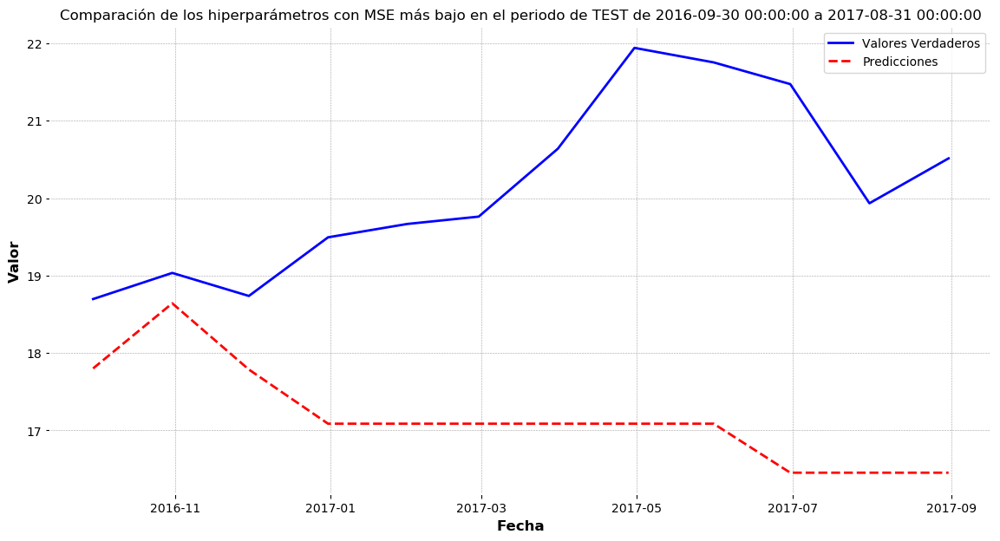

**************************************************
Índice: 1151
Fecha de inicio de TEST: 2017-09-30 00:00:00
Fecha de finalización de TEST: 2018-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 0.5075311932581048
Hiperparámetros: {'learning_rate': 0.06663802248029241, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.9448813058062155}


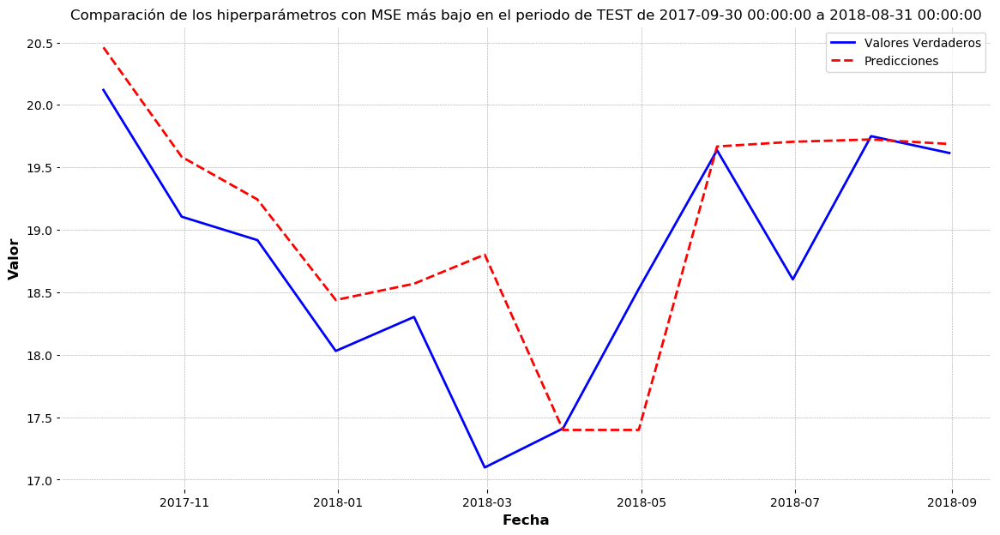

**************************************************
Índice: 1190
Fecha de inicio de TEST: 2018-09-30 00:00:00
Fecha de finalización de TEST: 2019-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 13.567052185993242
Hiperparámetros: {'learning_rate': 0.08566207896193731, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.6210736406890162}


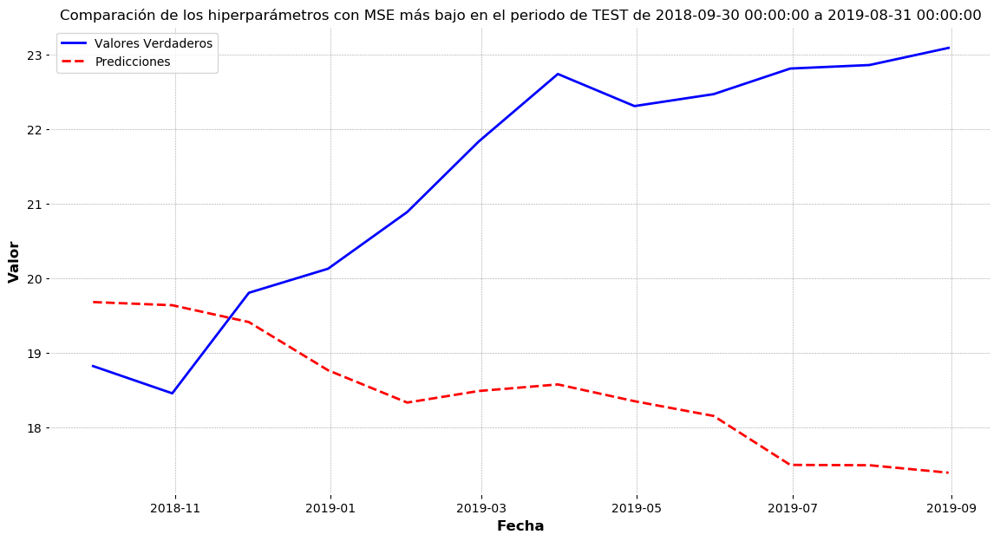

**************************************************
Índice: 1277
Fecha de inicio de TEST: 2019-09-30 00:00:00
Fecha de finalización de TEST: 2020-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 3.45415375736408
Hiperparámetros: {'learning_rate': 0.18990237365327778, 'max_depth': 9, 'min_child_weight': 5, 'n_estimators': 300, 'subsample': 0.8133309015535601}


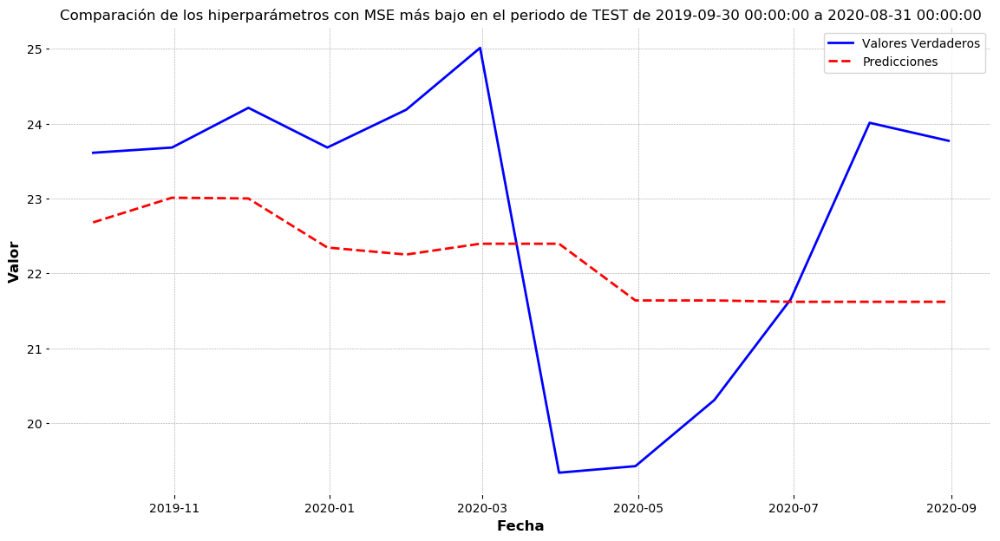

**************************************************
Índice: 1403
Fecha de inicio de TEST: 2020-09-30 00:00:00
Fecha de finalización de TEST: 2021-08-31 00:00:00
Lags utilizados: 20
MSE más bajo: 0.17085751956117531
Hiperparámetros: {'learning_rate': 0.12282436667667598, 'max_depth': 8, 'min_child_weight': 5, 'n_estimators': 400, 'subsample': 0.7274782612712665}


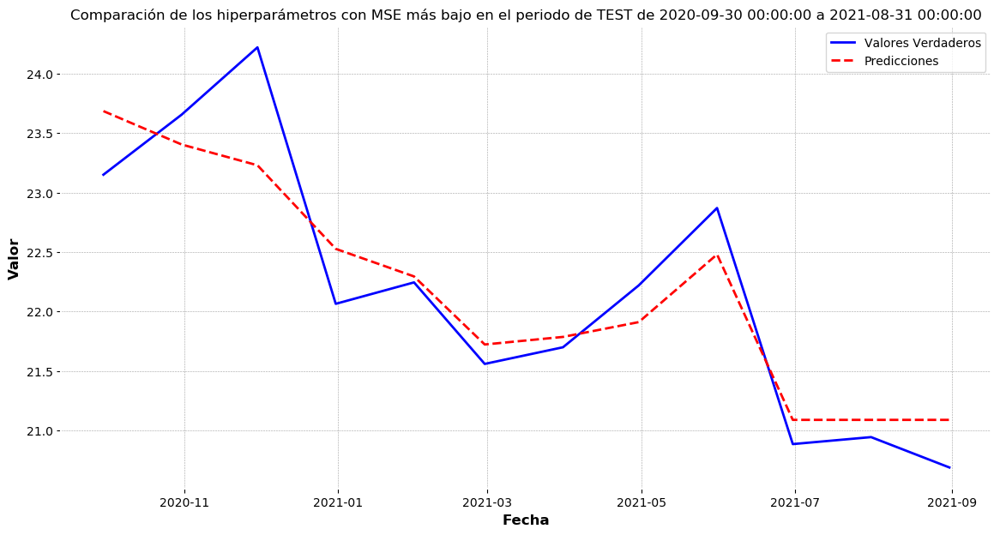

**************************************************
Índice: 1482
Fecha de inicio de TEST: 2021-09-30 00:00:00
Fecha de finalización de TEST: 2022-08-31 00:00:00
Lags utilizados: 5
MSE más bajo: 0.6644312819176128
Hiperparámetros: {'learning_rate': 0.14063038174576864, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 400, 'subsample': 0.6102482078440962}


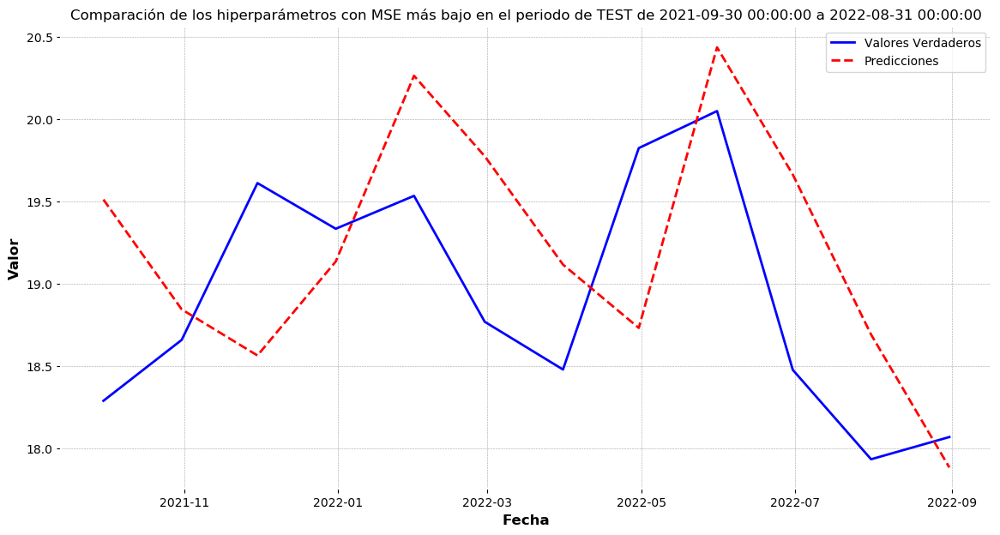

**************************************************


In [33]:
resultados_mse_minimos = resultados_xgb.loc[resultados_xgb.groupby(['start_test_date', 'end_test_date'])
                                            ['mse'].idxmin()]

resultados_mse_minimos_sorted = resultados_mse_minimos.sort_values(by='start_test_date')

for index, row in resultados_mse_minimos_sorted.iterrows():
    print(f"Índice: {index}")
    print(f"Fecha de inicio de TEST: {row['start_test_date']}")
    print(f"Fecha de finalización de TEST: {row['end_test_date']}")
    print(f"Lags utilizados: {row['lags']}")
    print(f"MSE más bajo: {row['mse']}")
    print(f"Hiperparámetros: {row['hyper']}")
    
    dates = pd.date_range(start=row['start_test_date'], end=row['end_test_date'], freq='M')
    
    lista_dividendos = dividendos_acumulados.reindex(dates, fill_value=0)
    
    row_real = row['real'] - lista_dividendos.values
    row_preds = row['preds'] - lista_dividendos.values
    
    plt.figure(figsize=(14, 7)) 
    plt.plot(dates, row_real, label='Valores Verdaderos', color='blue')
    plt.plot(dates, row_preds, label='Predicciones', color='red', linestyle='--')

    plt.title(f"Comparación de los hiperparámetros con MSE más bajo en el periodo de TEST de {row['start_test_date']} a {row['end_test_date']}")
    plt.xlabel('Fecha')
    plt.ylabel('Valor')

    plt.legend()

    plt.grid(True)

    plt.show()

    print("*"*50)

Analizamos los hiperparámetros que han tenido buenos resultados en los modelos anteriores, más en concreto en aquellos con MSE inferior a 3.

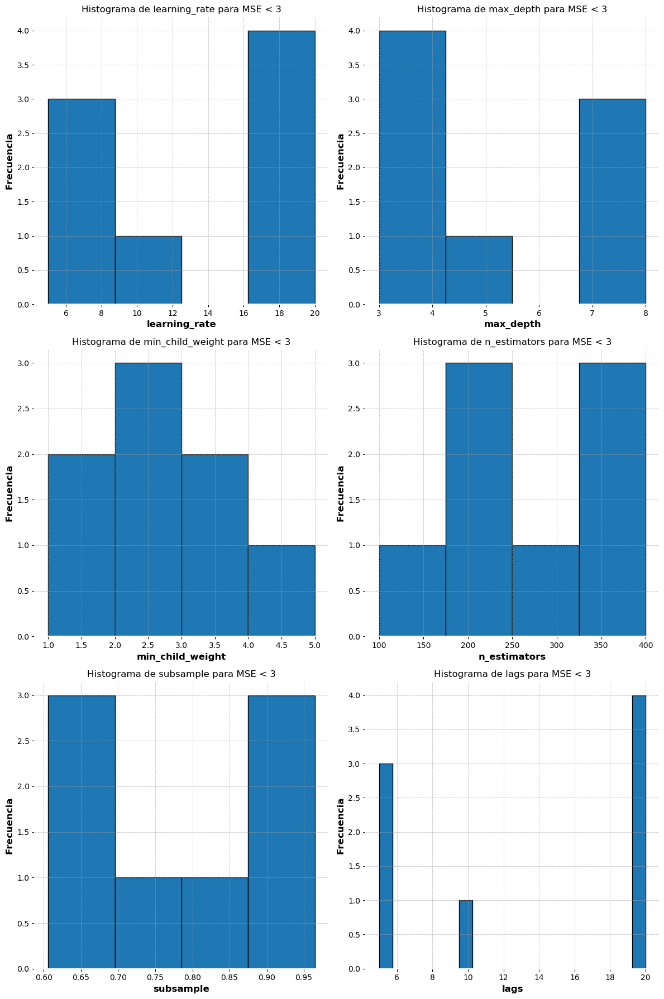

In [71]:
max_depth = resultados_mse_minimos_sorted[resultados_mse_minimos_sorted['mse'] < 3]['hyper'].apply(lambda x: x['max_depth'])
min_child_weight = resultados_mse_minimos_sorted[resultados_mse_minimos_sorted['mse'] < 3]['hyper'].apply(lambda x: x['min_child_weight'])
n_estimators = resultados_mse_minimos_sorted[resultados_mse_minimos_sorted['mse'] < 3]['hyper'].apply(lambda x: x['n_estimators'])
subsample = resultados_mse_minimos_sorted[resultados_mse_minimos_sorted['mse'] < 3]['hyper'].apply(lambda x: x['subsample'])
lags = resultados_mse_minimos_sorted[resultados_mse_minimos_sorted['mse'] < 3]['lags']

plt.figure(figsize=(12, 18))

# Histograma de learning_rate
plt.subplot(3, 2, 1)  
learning_rates.hist(bins=4, edgecolor='black')
plt.xlabel('learning_rate')
plt.ylabel('Frecuencia')
plt.title('Histograma de learning_rate para MSE < 3')
plt.grid(True)

# Histograma de max_depth
plt.subplot(3, 2, 2)  
max_depth.hist(bins=4, edgecolor='black')
plt.xlabel('max_depth')
plt.ylabel('Frecuencia')
plt.title('Histograma de max_depth para MSE < 3')
plt.grid(True)

# Histograma de min_child_weight
plt.subplot(3, 2, 3)  
min_child_weight.hist(bins=4, edgecolor='black')
plt.xlabel('min_child_weight')
plt.ylabel('Frecuencia')
plt.title('Histograma de min_child_weight para MSE < 3')
plt.grid(True)

# Histograma de n_estimators
plt.subplot(3, 2, 4)  
n_estimators.hist(bins=4, edgecolor='black')
plt.xlabel('n_estimators')
plt.ylabel('Frecuencia')
plt.title('Histograma de n_estimators para MSE < 3')
plt.grid(True)

# Histograma de subsample
plt.subplot(3, 2, 5)  
subsample.hist(bins=4, edgecolor='black')
plt.xlabel('subsample')
plt.ylabel('Frecuencia')
plt.title('Histograma de subsample para MSE < 3')
plt.grid(True)

# Histograma de lags
plt.subplot(3, 2, 6)  
lags.hist(bins=20, edgecolor='black')
plt.xlabel('lags')
plt.ylabel('Frecuencia')
plt.title('Histograma de lags para MSE < 3')
plt.grid(True)

plt.tight_layout()

plt.show()